# Visualização de dados. 

## 1) Coleta de dados. 

In [99]:
# Importing libraries
import pandas as pd
import numpy as np

import plotly.express as px
import seaborn as sns
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt #para gráficos
from sklearn import tree #Tem uma estrutura de árvore que será usada
from sklearn.tree import DecisionTreeClassifier #Classificador que gera uma árvore de regras

#### Parâmetros utilizados no processos

In [100]:
PARAMETROS_ESPECIES = ['Adelie','Gentoo','Chinstrap']

In [101]:
PARAMETROS_ILHAS = ['Biscoe','Dream','Torgersen']

In [102]:
PARAMETROS_SEXO = ['MALE','FEMALE']

#### Reading file.

In [103]:
initial_data = pd.read_csv("base_de_dados/penguins.csv")
initial_data

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,FEMALE
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,MALE
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,FEMALE


Vemos que tem dados invalidos no Dataframe, onde está escrito NaN.
Vamos mostrar os tipos de dados coletado no Dataframe.

We see that have invalid data in DataFrame, where is write NaN.
We'll go to show data types of collected DataFrame.

#### Tipo de dados.

In [104]:
print(initial_data.dtypes)

species               object
island                object
bill_length_mm       float64
bill_depth_mm        float64
flipper_length_mm    float64
body_mass_g          float64
sex                   object
dtype: object


Então aqui tmeos 3 do tipo categórico, e 4 do tipo numérico contínuo.

So here we have three of categorical type 
and four of continuous numerical type.

Quantity:

In [105]:
quantity = len(initial_data)
clean_quantity = len(initial_data.dropna(axis=0))
error_quantity = quantity - clean_quantity

print(f"Total quantity in Dataframe: {quantity}")
print(f"Total quantity with error in Dataframe: {error_quantity}")
print(f"Total quantity without error in Dataframe: {clean_quantity}")

Total quantity in Dataframe: 344
Total quantity with error in Dataframe: 11
Total quantity without error in Dataframe: 333


#### Converter categóricos para números.
 
#### Convert categoricals to numbers.

#### species

In [106]:
# 0 - Adelie. 1 - Gentoo. 2 - Chinstrap.
for i in range(len(initial_data)):
    x = initial_data.at[i,'species']
    if(x == "Adelie"):
        initial_data.at[i,'species'] = int(0)
    elif(x == "Gentoo"):
        initial_data.at[i,'species'] = int(1)
    elif(x == "Chinstrap"):
        initial_data.at[i,'species'] = int(2)
initial_data

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,0,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,0,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,0,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,0,Torgersen,NaN,NaN,NaN,NaN,NaN
4,0,Torgersen,36.7,19.3,193.0,3450.0,FEMALE
...,...,...,...,...,...,...,...
339,1,Biscoe,NaN,NaN,NaN,NaN,NaN
340,1,Biscoe,46.8,14.3,215.0,4850.0,FEMALE
341,1,Biscoe,50.4,15.7,222.0,5750.0,MALE
342,1,Biscoe,45.2,14.8,212.0,5200.0,FEMALE


#### island

In [107]:
# 0 - Biscoe. 1 - Dream. 2 - Torgersen.
for i in range(len(initial_data)):
    x = initial_data.at[i,'island']
    
    if(x == "Biscoe"):
        initial_data.at[i,'island'] = int(0)
    elif(x == "Dream"):
        initial_data.at[i,'island'] = int(1)
    elif(x == "Torgersen"):
        initial_data.at[i,'island'] = int(2)
initial_data

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,0,2,39.1,18.7,181.0,3750.0,MALE
1,0,2,39.5,17.4,186.0,3800.0,FEMALE
2,0,2,40.3,18.0,195.0,3250.0,FEMALE
3,0,2,NaN,NaN,NaN,NaN,NaN
4,0,2,36.7,19.3,193.0,3450.0,FEMALE
...,...,...,...,...,...,...,...
339,1,0,NaN,NaN,NaN,NaN,NaN
340,1,0,46.8,14.3,215.0,4850.0,FEMALE
341,1,0,50.4,15.7,222.0,5750.0,MALE
342,1,0,45.2,14.8,212.0,5200.0,FEMALE


#### sex

In [108]:
# 0 - MALE. 1 - FEMALE.
for i in range(len(initial_data)):
    x = initial_data.at[i,'sex']

    if(x == "MALE"):
        initial_data.at[i,'sex'] = int(0)
    elif(x == "FEMALE"):
        initial_data.at[i,'sex'] = int(1)
        
initial_data

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,0,2,39.1,18.7,181.0,3750.0,0
1,0,2,39.5,17.4,186.0,3800.0,1
2,0,2,40.3,18.0,195.0,3250.0,1
3,0,2,NaN,NaN,NaN,NaN,NaN
4,0,2,36.7,19.3,193.0,3450.0,1
...,...,...,...,...,...,...,...
339,1,0,NaN,NaN,NaN,NaN,NaN
340,1,0,46.8,14.3,215.0,4850.0,1
341,1,0,50.4,15.7,222.0,5750.0,0
342,1,0,45.2,14.8,212.0,5200.0,1


##### plot

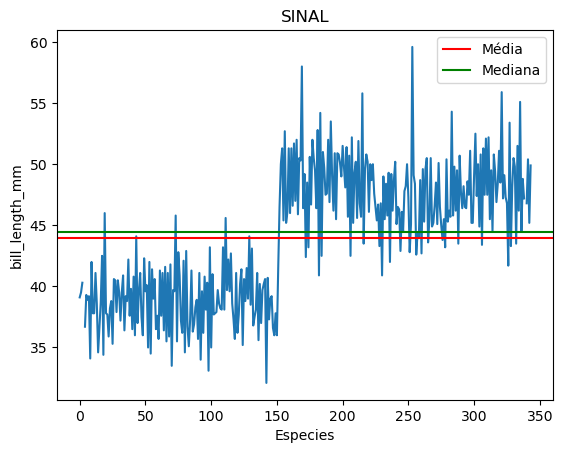

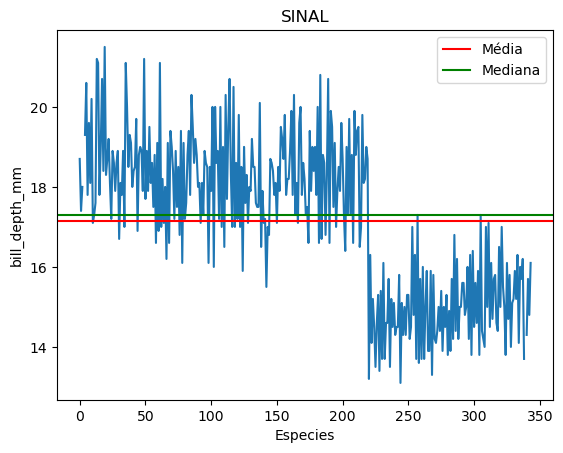

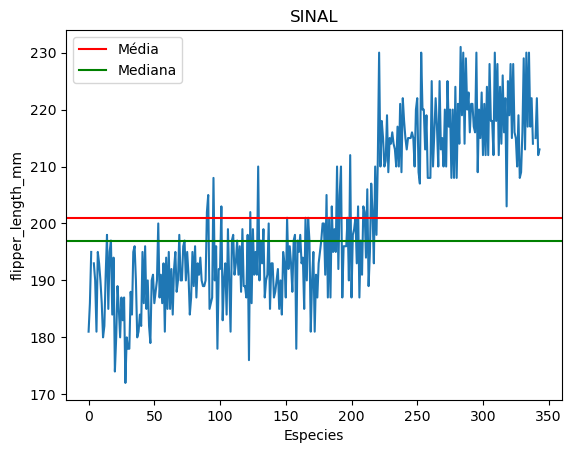

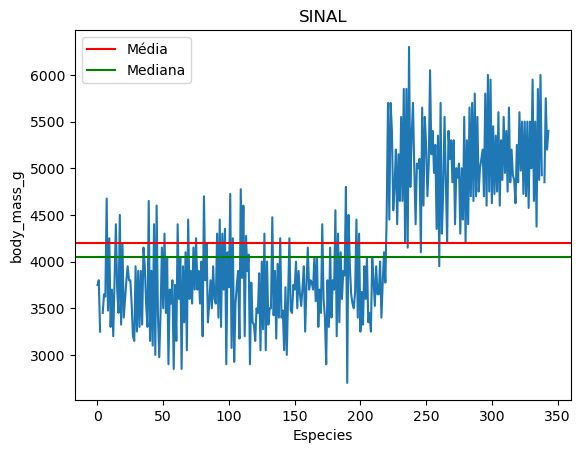

In [109]:
for a in range(4):
    plt.plot(initial_data[initial_data.columns[a+2]])
    plt.axhline(y=initial_data[initial_data.columns[a+2]].mean(), color='r', label='Média')
    plt.axhline(y=initial_data[initial_data.columns[a+2]].median(), color='g', label='Mediana')
    plt.title(f"SINAL")
    plt.xlabel("Especies")
    plt.ylabel(f"{initial_data.columns[a+2]}")
    plt.legend()
    plt.show()

#### Histograma

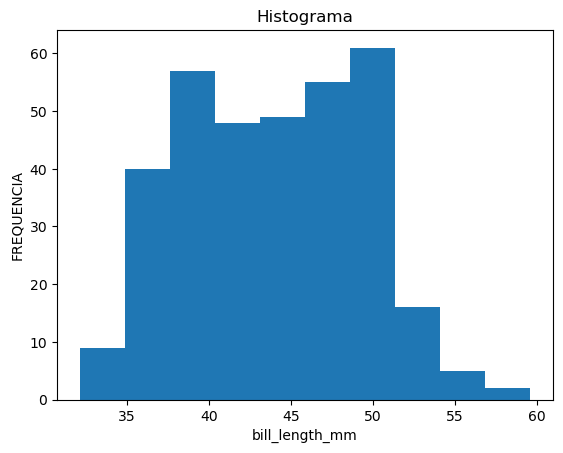

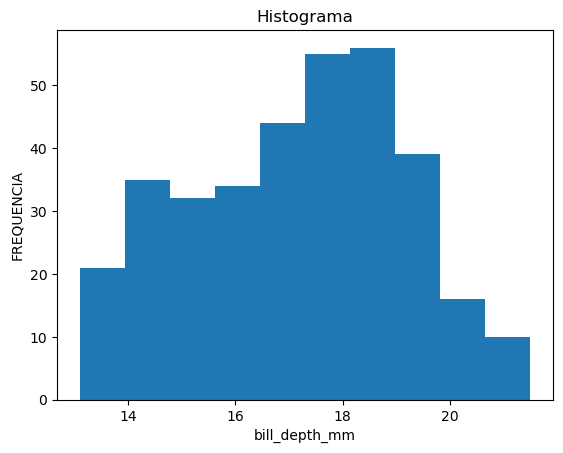

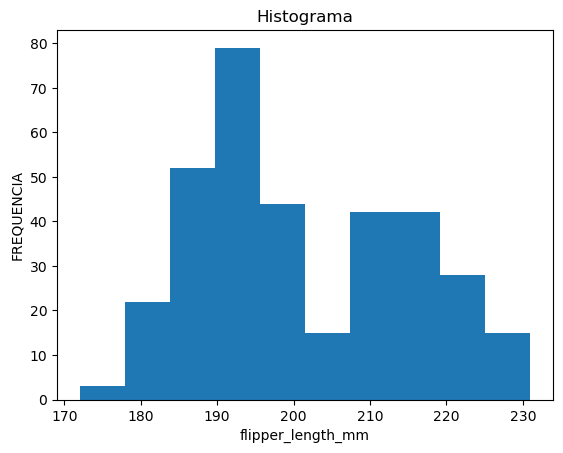

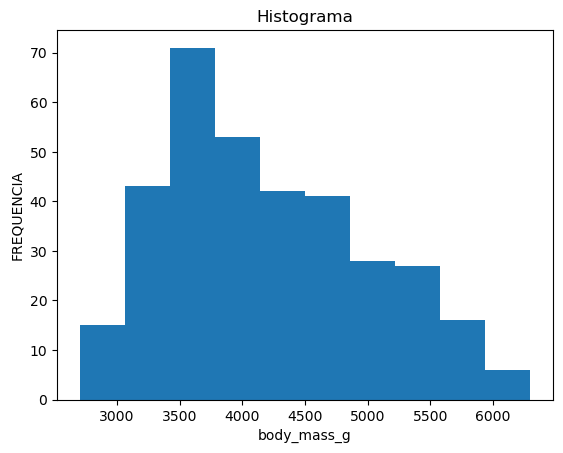

In [110]:
for a in range(4):
    plt.hist(initial_data[initial_data.columns[a+2]])
    plt.title(f"Histograma")
    plt.xlabel(f"{initial_data.columns[a+2]}")
    plt.ylabel("FREQUENCIA")
    plt.show()

##### Scatter

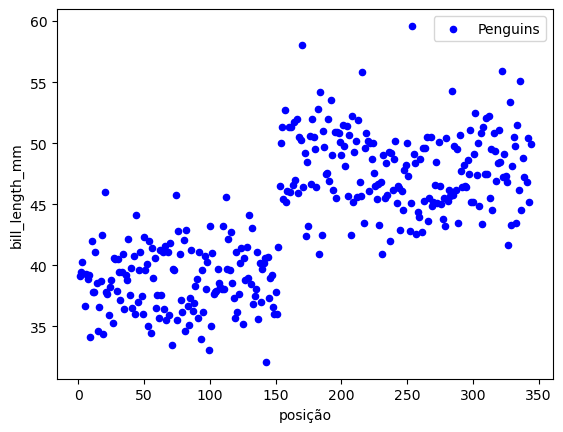

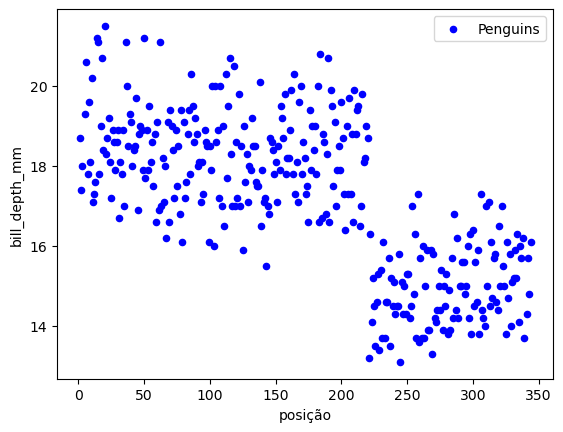

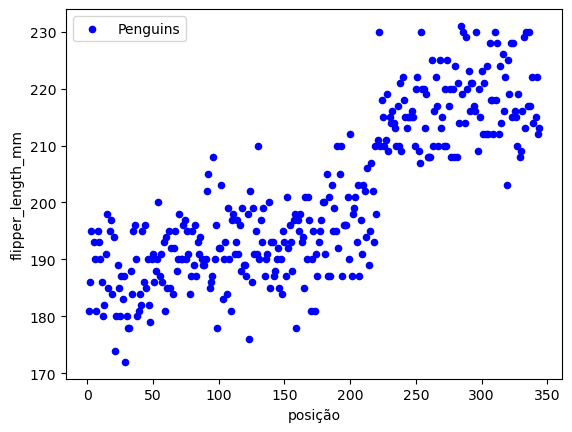

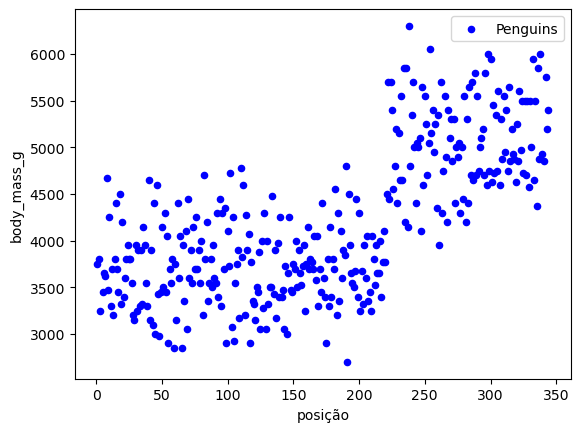

In [111]:
initial_data['posição'] = list(range(1, len(initial_data)+1))
for i in range(4):
    initial_data.plot.scatter('posição',i+2,color='b', label='Penguins')

## 2) Limpeza dos dados.

#### Localizar erros. 
#### locate errors

In [112]:
error_quantity_attributes = 0

row = []
columns = []

# Percorrendo por cada caluna.
for x in range(7):
    
    # Percorre cada item da coluna.
    for i in range(quantity):
        y = initial_data[initial_data.columns[x]][i]
        
        # Se o item for nulo.
        if(pd.isnull(y)):
            error_quantity_attributes += 1 # total de erro recebe mais 1.
            row.append(i) # adiciona a localização do item na lista row
            columns.append(x) # add posição da coluna na lissta columns.

print(f"\nError quantity attributes:", error_quantity_attributes)

row.sort()
print(f"\nNº of lines: \t\t{row}")
print(f"Nº of columns: \t\t{columns}")

row = list(set(row))
row.sort()
print(f"\nIndex with error: \t{row}")


Error quantity attributes: 19

Nº of lines: 		[3, 3, 3, 3, 3, 8, 9, 10, 11, 47, 246, 286, 324, 336, 339, 339, 339, 339, 339]
Nº of columns: 		[2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6]

Index with error: 	[3, 8, 9, 10, 11, 47, 246, 286, 324, 336, 339]


#### Filtrando especies.

In [113]:
ESPECIES_Adelie = initial_data.query("species == 0")
ESPECIES_Gentoo = initial_data.query("species == 1")
ESPECIES_Chinstrap = initial_data.query("species == 2")

#### Detalhando ilhas por especies.

In [114]:
print(f"\n ESPECIE Adelie: \n{ESPECIES_Adelie.value_counts('island')}")
print(f"\n ESPECIE Gentoo: \n{ESPECIES_Gentoo.value_counts('island')}") # ok
print(f"\n ESPECIE Chinstrap: \n{ESPECIES_Chinstrap.value_counts('island')}")


 ESPECIE Adelie: 
island
1    56
2    52
0    44
dtype: int64

 ESPECIE Gentoo: 
island
0    124
dtype: int64

 ESPECIE Chinstrap: 
island
1    68
dtype: int64


#### Filtrando especies e ilhas.

In [115]:
ESPECIES_Gentoo_Biscoe = ESPECIES_Gentoo.query("island == 0")

ESPECIES_Chinstrap_Dream = ESPECIES_Chinstrap.query("island == 1")

ESPECIES_Adelie_Biscoe = ESPECIES_Adelie.query("island == 0")
ESPECIES_Adelie_Dream = ESPECIES_Adelie.query("island == 1")
ESPECIES_Adelie_Torgersen = ESPECIES_Adelie.query("island == 2")

## Dado estatistícos.
#### Especie Adelie na Ilha Biscoe.

In [116]:
print("Especie Adelie e Ilha Biscoe.")
print("\nTotal:")
print(ESPECIES_Adelie_Biscoe.describe())
print("\nMale:")
print(ESPECIES_Adelie_Biscoe.query("sex == 0").describe())
print("\nFemale:")
print(ESPECIES_Adelie_Biscoe.query("sex == 1").describe())

print("\n\nVariancia\n")
l = []
for i in range(len(ESPECIES_Adelie.columns) - 3):
    media_PROFUNDIDADE_BICO_MM = ESPECIES_Adelie_Biscoe[ESPECIES_Adelie.columns[i+2]].var()
    media_PROFUNDIDADE_BICO_MM_M = ESPECIES_Adelie_Biscoe.query("sex == 0")[ESPECIES_Adelie.columns[i+2]].var()
    media_PROFUNDIDADE_BICO_MM_F = ESPECIES_Adelie_Biscoe.query("sex == 1")[ESPECIES_Adelie.columns[i+2]].var()
    l.append(pd.Series([media_PROFUNDIDADE_BICO_MM, media_PROFUNDIDADE_BICO_MM_M, media_PROFUNDIDADE_BICO_MM_F], index=["Total", "Male", "FEMALE"]))
print(pd.DataFrame(l, index=[ESPECIES_Adelie.columns[2],ESPECIES_Adelie.columns[3],ESPECIES_Adelie.columns[4],ESPECIES_Adelie.columns[5]]))

print("\n\nModa\n")
l = []
for i in range(len(ESPECIES_Adelie.columns) - 3):
    media_PROFUNDIDADE_BICO_MM = ESPECIES_Adelie_Biscoe[ESPECIES_Adelie.columns[i+2]].mode().iloc[0]
    media_PROFUNDIDADE_BICO_MM_M = ESPECIES_Adelie_Biscoe.query("sex == 0")[ESPECIES_Adelie.columns[i+2]].mode().iloc[0]
    media_PROFUNDIDADE_BICO_MM_F = ESPECIES_Adelie_Biscoe.query("sex == 1")[ESPECIES_Adelie.columns[i+2]].mode().iloc[0]
    l.append(pd.Series([media_PROFUNDIDADE_BICO_MM, media_PROFUNDIDADE_BICO_MM_M, media_PROFUNDIDADE_BICO_MM_F], index=["Total", "Male", "FEMALE"]))
print(pd.DataFrame(l, index=[ESPECIES_Adelie.columns[2],ESPECIES_Adelie.columns[3],ESPECIES_Adelie.columns[4],ESPECIES_Adelie.columns[5]]))

qtd_M = ESPECIES_Adelie_Biscoe.query("sex == 0")
qtd_F = ESPECIES_Adelie_Biscoe.query("sex == 1")

print(f"\nQuantidade de Machos: {len(qtd_M)}")
print(f"Quantidade de Femeas:{len(qtd_F)}")
print(f"Total :{len(qtd_F) + len(qtd_M)}")


Especie Adelie e Ilha Biscoe.

Total:
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       44.000000      44.000000          44.000000    44.000000   
mean        38.975000      18.370455         188.795455  3709.659091   
std          2.480916       1.188820           6.729247   487.733722   
min         34.500000      16.000000         172.000000  2850.000000   
25%         37.675000      17.650000         184.750000  3387.500000   
50%         38.700000      18.450000         189.500000  3750.000000   
75%         40.700000      19.025000         193.000000  3975.000000   
max         45.600000      21.100000         203.000000  4775.000000   

          posição  
count   44.000000  
mean    69.590909  
std     32.850131  
min     21.000000  
25%     51.750000  
50%     62.500000  
75%    105.250000  
max    116.000000  

Male:
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       22.000000      22.000000          22.00000

ValueError: Length of values (5) does not match length of index (4)

#### ESPECIE Adelie na Ilha Dream.

In [117]:
print("ESPECIES Adelie Dream.")
print("\nTotal:")
print(ESPECIES_Adelie_Dream.describe())
print("\nMale:")
print(ESPECIES_Adelie_Dream.query("sex == 0").describe())
print("\nFemale:")
print(ESPECIES_Adelie_Dream.query("sex == 1").describe())
    
print("\n\nVariancia\n")
l = []
for i in range(len(ESPECIES_Adelie.columns) - 3):
    media_PROFUNDIDADE_BICO_MM = ESPECIES_Adelie_Dream[ESPECIES_Adelie.columns[i+2]].var()
    media_PROFUNDIDADE_BICO_MM_M = ESPECIES_Adelie_Dream.query("sex == 0")[ESPECIES_Adelie.columns[i+2]].var()
    media_PROFUNDIDADE_BICO_MM_F = ESPECIES_Adelie_Dream.query("sex == 1")[ESPECIES_Adelie.columns[i+2]].var()
    l.append(pd.Series([media_PROFUNDIDADE_BICO_MM, media_PROFUNDIDADE_BICO_MM_M, media_PROFUNDIDADE_BICO_MM_F], index=["Total", "Male", "FEMALE"]))
print(pd.DataFrame(l, index=[ESPECIES_Adelie.columns[2],ESPECIES_Adelie.columns[3],ESPECIES_Adelie.columns[4],ESPECIES_Adelie.columns[5]]))

print("\n\nModa\n")
l = []
for i in range(len(ESPECIES_Adelie.columns) - 3):
    media_PROFUNDIDADE_BICO_MM = ESPECIES_Adelie_Dream[ESPECIES_Adelie.columns[i+2]].mode().iloc[0]
    media_PROFUNDIDADE_BICO_MM_M = ESPECIES_Adelie_Dream.query("sex == 0")[ESPECIES_Adelie.columns[i+2]].mode().iloc[0]
    media_PROFUNDIDADE_BICO_MM_F = ESPECIES_Adelie_Dream.query("sex == 1")[ESPECIES_Adelie.columns[i+2]].mode().iloc[0]
    l.append(pd.Series([media_PROFUNDIDADE_BICO_MM, media_PROFUNDIDADE_BICO_MM_M, media_PROFUNDIDADE_BICO_MM_F], index=["Total", "Male", "FEMALE"]))
print(pd.DataFrame(l, index=[ESPECIES_Adelie.columns[2],ESPECIES_Adelie.columns[3],ESPECIES_Adelie.columns[4],ESPECIES_Adelie.columns[5]]))

qtd_M = ESPECIES_Adelie_Dream.query("sex == 0")
qtd_F = ESPECIES_Adelie_Dream.query("sex == 1")

print(f"\nQuantidade de Machos: {len(qtd_M)}")
print(f"Quantidade de Femeas:{len(qtd_F)}")
print(f"Total :{len(qtd_F) + len(qtd_M)}")



ESPECIES Adelie Dream.

Total:
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       56.000000      56.000000          56.000000    56.000000   
mean        38.501786      18.251786         189.732143  3688.392857   
std          2.465359       1.133617           6.585083   455.146437   
min         32.100000      15.500000         178.000000  2900.000000   
25%         36.750000      17.500000         185.000000  3387.500000   
50%         38.550000      18.400000         190.000000  3575.000000   
75%         40.375000      18.825000         193.000000  3981.250000   
max         44.100000      21.200000         208.000000  4650.000000   

          posição  
count   56.000000  
mean    91.785714  
std     43.842990  
min     31.000000  
25%     44.750000  
50%     92.500000  
75%    138.250000  
max    152.000000  

Male:
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       28.000000      28.000000          28.000000    28

ValueError: Length of values (5) does not match length of index (4)

In [118]:
ESPECIES_Adelie_Dream.query("sex != 0 and sex != 1")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
47,0,1,37.5,18.9,179.0,2975.0,NaN,48


Femea. Female.

In [119]:
ESPECIES_Adelie_Dream.query("body_mass_g <= 3600  and bill_length_mm < 40.6")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
30,0,1,39.5,16.7,178.0,3250.0,1,31
32,0,1,39.5,17.8,188.0,3300.0,1,33
34,0,1,36.4,17.0,195.0,3325.0,1,35
38,0,1,37.6,19.3,181.0,3300.0,1,39
40,0,1,36.5,18.0,182.0,3150.0,1,41
42,0,1,36.0,18.5,186.0,3100.0,1,43
44,0,1,37.0,16.9,185.0,3000.0,1,45
47,0,1,37.5,18.9,179.0,2975.0,NaN,48
48,0,1,36.0,17.9,190.0,3450.0,1,49
84,0,1,37.3,17.8,191.0,3350.0,1,85


Macho. Male.

In [120]:
ESPECIES_Adelie_Dream.query("body_mass_g > 3425") ## avaliar

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
31,0,1,37.2,18.1,178.0,3900.0,0,32
33,0,1,40.9,18.9,184.0,3900.0,0,34
35,0,1,39.2,21.1,196.0,4150.0,0,36
36,0,1,38.8,20.0,190.0,3950.0,0,37
37,0,1,42.2,18.5,180.0,3550.0,1,38
39,0,1,39.8,19.1,184.0,4650.0,0,40
41,0,1,40.8,18.4,195.0,3900.0,0,42
43,0,1,44.1,19.7,196.0,4400.0,0,44
45,0,1,39.6,18.8,190.0,4600.0,0,46
48,0,1,36.0,17.9,190.0,3450.0,1,49


#### ESPECIES Adelie Torgersen

In [138]:
print("ESPECIES Adelie Torgersen")
print("\nTotal:")
print(ESPECIES_Adelie_Torgersen.describe())
print("\nMale:")
print(ESPECIES_Adelie_Torgersen.query("sex == 0").describe())
print("\nFemale:")
print(ESPECIES_Adelie_Torgersen.query("sex == 1").describe())
    
print("\n\nVariancia\n")
l = []
for i in range(len(ESPECIES_Adelie.columns) - 4):
    media_PROFUNDIDADE_BICO_MM = ESPECIES_Adelie_Torgersen[ESPECIES_Adelie.columns[i+2]].var()
    media_PROFUNDIDADE_BICO_MM_M = ESPECIES_Adelie_Torgersen.query("sex == 0")[ESPECIES_Adelie.columns[i+2]].var()
    media_PROFUNDIDADE_BICO_MM_F = ESPECIES_Adelie_Torgersen.query("sex == 1")[ESPECIES_Adelie.columns[i+2]].var()
    l.append(pd.Series([media_PROFUNDIDADE_BICO_MM, media_PROFUNDIDADE_BICO_MM_M, media_PROFUNDIDADE_BICO_MM_F], index=["Total", "Male", "FEMALE"]))
print(pd.DataFrame(l, index=[ESPECIES_Adelie.columns[2],ESPECIES_Adelie.columns[3],ESPECIES_Adelie.columns[4],ESPECIES_Adelie.columns[5]]))

print("\n\nModa\n")
l = []
for i in range(len(ESPECIES_Adelie.columns) - 4):
    media_PROFUNDIDADE_BICO_MM = ESPECIES_Adelie_Torgersen[ESPECIES_Adelie.columns[i+2]].mode().iloc[0]
    media_PROFUNDIDADE_BICO_MM_M = ESPECIES_Adelie_Torgersen.query("sex == 0")[ESPECIES_Adelie.columns[i+2]].mode().iloc[0]
    media_PROFUNDIDADE_BICO_MM_F = ESPECIES_Adelie_Torgersen.query("sex == 1")[ESPECIES_Adelie.columns[i+2]].mode().iloc[0]
    l.append(pd.Series([media_PROFUNDIDADE_BICO_MM, media_PROFUNDIDADE_BICO_MM_M, media_PROFUNDIDADE_BICO_MM_F], index=["Total", "Male", "FEMALE"]))
print(pd.DataFrame(l, index=[ESPECIES_Adelie.columns[2],ESPECIES_Adelie.columns[3],ESPECIES_Adelie.columns[4],ESPECIES_Adelie.columns[5]]))

qtd_M = ESPECIES_Adelie_Torgersen.query("sex == 0")
qtd_F = ESPECIES_Adelie_Torgersen.query("sex == 1")

print(f"\nQuantidade de Machos: {len(qtd_M)}")
print(f"Quantidade de Femeas:{len(qtd_F)}")
print(f"Total :{len(qtd_F) + len(qtd_M)}")


ESPECIES Adelie Torgersen

Total:
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       51.000000      51.000000          51.000000    51.000000   
mean        38.950980      18.429412         191.196078  3706.372549   
std          3.025318       1.339447           6.232238   445.107940   
min         33.500000      15.900000         176.000000  2900.000000   
25%         36.650000      17.350000         187.000000  3337.500000   
50%         38.900000      18.400000         191.000000  3700.000000   
75%         41.100000      19.250000         195.000000  4000.000000   
max         46.000000      21.500000         210.000000  4700.000000   

          posição  
count   52.000000  
mean    65.884615  
std     48.399746  
min      1.000000  
25%     13.750000  
50%     74.500000  
75%    119.250000  
max    132.000000  

Male:
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       23.000000      23.000000          23.000000   

#### ERROS da Especies Adelie da ilha Torgersen.

In [122]:
ESPECIES_Adelie_Torgersen.query("sex != 1 and sex != 0")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
3,0,2,NaN,NaN,NaN,NaN,NaN,4
8,0,2,34.1,18.1,193.0,3475.0,NaN,9
9,0,2,42.0,20.2,190.0,4250.0,NaN,10
10,0,2,37.8,17.1,186.0,3300.0,NaN,11
11,0,2,37.8,17.3,180.0,3700.0,NaN,12


####  Machos da Especies Adelie da ilha Torgersen.

In [123]:
ESPECIES_Adelie_Torgersen.query("bill_depth_mm > 19.3")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
5,0,2,39.3,20.6,190.0,3650.0,0,6
7,0,2,39.2,19.6,195.0,4675.0,0,8
9,0,2,42.0,20.2,190.0,4250.0,NaN,10
13,0,2,38.6,21.2,191.0,3800.0,0,14
14,0,2,34.6,21.1,198.0,4400.0,0,15
17,0,2,42.5,20.7,197.0,4500.0,0,18
19,0,2,46.0,21.5,194.0,4200.0,0,20
69,0,2,41.8,19.4,198.0,4450.0,0,70
77,0,2,37.2,19.4,184.0,3900.0,0,78
83,0,2,35.1,19.4,193.0,4200.0,0,84


#### Femeas da Especies Adelie da ilha Torgersen.

In [124]:
ESPECIES_Adelie_Torgersen.query("bill_depth_mm < 19.3 and bill_length_mm < 37.9")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
8,0,2,34.1,18.1,193.0,3475.0,NaN,9
10,0,2,37.8,17.1,186.0,3300.0,NaN,11
11,0,2,37.8,17.3,180.0,3700.0,NaN,12
15,0,2,36.6,17.8,185.0,3700.0,1,16
18,0,2,34.4,18.4,184.0,3325.0,1,19
68,0,2,35.9,16.6,190.0,3050.0,1,69
70,0,2,33.5,19.0,190.0,3600.0,1,71
74,0,2,35.5,17.5,190.0,3700.0,1,75
78,0,2,36.2,16.1,187.0,3550.0,1,79
80,0,2,34.6,17.2,189.0,3200.0,1,81


#### Especie Gentoo e Ilha Biscoe.

In [137]:
print("Especie Gentoo e Ilha Biscoe.")
print("\nTotal:")
print(ESPECIES_Gentoo_Biscoe.describe())
print("\nMale:")
print(ESPECIES_Gentoo_Biscoe.query("sex == 0").describe())
print("\nFemale:")
print(ESPECIES_Gentoo_Biscoe.query("sex == 1").describe())
    
print("\n\nVariancia\n")
l = []
for i in range(len(ESPECIES_Gentoo.columns) - 4):
    media_PROFUNDIDADE_BICO_MM = ESPECIES_Gentoo_Biscoe[ESPECIES_Gentoo.columns[i+2]].var()
    media_PROFUNDIDADE_BICO_MM_M = ESPECIES_Gentoo_Biscoe.query("sex == 0")[ESPECIES_Gentoo.columns[i+2]].var()
    media_PROFUNDIDADE_BICO_MM_F = ESPECIES_Gentoo_Biscoe.query("sex == 1")[ESPECIES_Gentoo.columns[i+2]].var()
    l.append(pd.Series([media_PROFUNDIDADE_BICO_MM, media_PROFUNDIDADE_BICO_MM_M, media_PROFUNDIDADE_BICO_MM_F], index=["Total", "Male", "FEMALE"]))
print(pd.DataFrame(l, index=[ESPECIES_Gentoo.columns[2],ESPECIES_Gentoo.columns[3],ESPECIES_Gentoo.columns[4],ESPECIES_Gentoo.columns[5]]))

print("\n\nModa\n")
l = []
for i in range(len(ESPECIES_Gentoo.columns) - 4):
    media_PROFUNDIDADE_BICO_MM = ESPECIES_Gentoo_Biscoe[ESPECIES_Gentoo.columns[i+2]].mode().iloc[0]
    media_PROFUNDIDADE_BICO_MM_M = ESPECIES_Gentoo_Biscoe.query("sex == 0")[ESPECIES_Gentoo.columns[i+2]].mode().iloc[0]
    media_PROFUNDIDADE_BICO_MM_F = ESPECIES_Gentoo_Biscoe.query("sex == 1")[ESPECIES_Gentoo.columns[i+2]].mode().iloc[0]
    l.append(pd.Series([media_PROFUNDIDADE_BICO_MM, media_PROFUNDIDADE_BICO_MM_M, media_PROFUNDIDADE_BICO_MM_F], index=["Total", "Male", "FEMALE"]))
print(pd.DataFrame(l, index=[ESPECIES_Gentoo.columns[2],ESPECIES_Gentoo.columns[3],ESPECIES_Gentoo.columns[4],ESPECIES_Gentoo.columns[5]]))

qtd_M = ESPECIES_Gentoo_Biscoe.query("sex == 0")
qtd_F = ESPECIES_Gentoo_Biscoe.query("sex == 1")

print(f"\nQuantidade de Machos: {len(qtd_M)}")
print(f"Quantidade de Femeas:{len(qtd_F)}")
print(f"Total :{len(qtd_F) + len(qtd_M)}")

Especie Gentoo e Ilha Biscoe.

Total:
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count      123.000000     123.000000         123.000000   123.000000   
mean        47.504878      14.982114         217.186992  5076.016260   
std          3.081857       0.981220           6.484976   504.116237   
min         40.900000      13.100000         203.000000  3950.000000   
25%         45.300000      14.200000         212.000000  4700.000000   
50%         47.300000      15.000000         216.000000  5000.000000   
75%         49.550000      15.700000         221.000000  5500.000000   
max         59.600000      17.300000         231.000000  6300.000000   

          posição  
count  124.000000  
mean   282.500000  
std     35.939764  
min    221.000000  
25%    251.750000  
50%    282.500000  
75%    313.250000  
max    344.000000  

Male:
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       61.000000      61.000000          61.00000

#### Erros da especie Gentoo e ilha Biscoe.

In [126]:
ESPECIES_Gentoo_Biscoe.query("sex != 0 and sex != 1")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
246,1,0,44.5,14.3,216.0,4100.0,NaN,247
286,1,0,46.2,14.4,214.0,4650.0,NaN,287
324,1,0,47.3,13.8,216.0,4725.0,NaN,325
336,1,0,44.5,15.7,217.0,4875.0,NaN,337
339,1,0,NaN,NaN,NaN,NaN,NaN,340


#### Femea da especie Gentoo e Ilha Biscoe.

In [127]:
ESPECIES_Gentoo_Biscoe.query("bill_depth_mm < 15.50 and  body_mass_g < 4750")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
220,1,0,46.1,13.2,211.0,4500.0,1,221
222,1,0,48.7,14.1,210.0,4450.0,1,223
225,1,0,46.5,13.5,210.0,4550.0,1,226
228,1,0,43.3,13.4,209.0,4400.0,1,229
230,1,0,40.9,13.7,214.0,4650.0,1,231
232,1,0,45.5,13.7,214.0,4650.0,1,233
234,1,0,45.8,14.6,210.0,4200.0,1,235
236,1,0,42.0,13.5,210.0,4150.0,1,237
242,1,0,46.5,14.5,213.0,4400.0,1,243
246,1,0,44.5,14.3,216.0,4100.0,NaN,247


#### Macho da especie Gentoo e Ilha Biscoe.

In [128]:
ESPECIES_Gentoo_Biscoe.query("bill_depth_mm > 15.50")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
221,1,0,50.0,16.3,230.0,5700.0,0,222
231,1,0,49.0,16.1,216.0,5550.0,0,232
235,1,0,49.3,15.7,217.0,5850.0,0,236
243,1,0,46.3,15.8,215.0,5050.0,0,244
253,1,0,59.6,17.0,230.0,6050.0,0,254
255,1,0,48.4,16.3,220.0,5400.0,0,256
257,1,0,44.4,17.3,219.0,5250.0,0,258
259,1,0,48.7,15.7,208.0,5350.0,0,260
261,1,0,49.6,16.0,225.0,5700.0,0,262
264,1,0,50.5,15.9,222.0,5550.0,0,265


#### ESPECIES Chinstrap e Ilha Dream.

In [135]:
print("ESPECIES Chinstrap e Ilha Dream.")
print("\nTotal:")
print(ESPECIES_Chinstrap_Dream.describe())
print("\nMale:")
print(ESPECIES_Chinstrap_Dream.query("sex == 0").describe())
print("\nFemale:")
print(ESPECIES_Chinstrap_Dream.query("sex == 1").describe())
    
print("\n\nVariancia\n")
l = []
for i in range(len(ESPECIES_Chinstrap.columns) - 4):
    media_PROFUNDIDADE_BICO_MM = ESPECIES_Chinstrap_Dream[ESPECIES_Chinstrap.columns[i+2]].var()
    media_PROFUNDIDADE_BICO_MM_M = ESPECIES_Chinstrap_Dream.query("sex == 0")[ESPECIES_Chinstrap.columns[i+2]].var()
    media_PROFUNDIDADE_BICO_MM_F = ESPECIES_Chinstrap_Dream.query("sex == 1")[ESPECIES_Chinstrap.columns[i+2]].var()
    l.append(pd.Series([media_PROFUNDIDADE_BICO_MM, media_PROFUNDIDADE_BICO_MM_M, media_PROFUNDIDADE_BICO_MM_F], index=["Total", "Male", "FEMALE"]))
print(pd.DataFrame(l, index=[ESPECIES_Chinstrap.columns[2],ESPECIES_Chinstrap.columns[3],ESPECIES_Chinstrap.columns[4],ESPECIES_Chinstrap.columns[5]]))

print("\n\nModa\n")
l = []
for i in range(len(ESPECIES_Chinstrap.columns) - 4):
    media_PROFUNDIDADE_BICO_MM = ESPECIES_Chinstrap_Dream[ESPECIES_Chinstrap.columns[i+2]].mode().iloc[0]
    media_PROFUNDIDADE_BICO_MM_M = ESPECIES_Chinstrap_Dream.query("sex == 0")[ESPECIES_Chinstrap.columns[i+2]].mode().iloc[0]
    media_PROFUNDIDADE_BICO_MM_F = ESPECIES_Chinstrap_Dream.query("sex == 1")[ESPECIES_Chinstrap.columns[i+2]].mode().iloc[0]
    l.append(pd.Series([media_PROFUNDIDADE_BICO_MM, media_PROFUNDIDADE_BICO_MM_M, media_PROFUNDIDADE_BICO_MM_F], index=["Total", "Male", "FEMALE"]))
print(pd.DataFrame(l, index=[ESPECIES_Chinstrap.columns[2],ESPECIES_Chinstrap.columns[3],ESPECIES_Chinstrap.columns[4],ESPECIES_Chinstrap.columns[5]]))

qtd_M = ESPECIES_Chinstrap_Dream.query("sex == 0")
qtd_F = ESPECIES_Chinstrap_Dream.query("sex == 1")

print(f"\nQuantidade de Machos: {len(qtd_M)}")
print(f"Quantidade de Femeas:{len(qtd_F)}")
print(f"Total :{len(qtd_F) + len(qtd_M)}")

ESPECIES Chinstrap e Ilha Dream.

Total:
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       68.000000      68.000000          68.000000    68.000000   
mean        48.833824      18.420588         195.823529  3733.088235   
std          3.339256       1.135395           7.131894   384.335081   
min         40.900000      16.400000         178.000000  2700.000000   
25%         46.350000      17.500000         191.000000  3487.500000   
50%         49.550000      18.450000         196.000000  3700.000000   
75%         51.075000      19.400000         201.000000  3950.000000   
max         58.000000      20.800000         212.000000  4800.000000   

         posição  
count   68.00000  
mean   186.50000  
std     19.77372  
min    153.00000  
25%    169.75000  
50%    186.50000  
75%    203.25000  
max    220.00000  

Male:
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       34.000000      34.000000          34.000000    3

#### Erros da especie Chinstrap e ilha Dream

In [130]:
ESPECIES_Chinstrap_Dream.query("sex != 0 and sex != 1")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição


#### Exibir indices com erros de todo o DataFrame

In [33]:
initial_data.iloc[row]

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
3,0,2,NaN,NaN,NaN,NaN,NaN,4
8,0,2,34.1,18.1,193.0,3475.0,NaN,9
9,0,2,42.0,20.2,190.0,4250.0,NaN,10
10,0,2,37.8,17.1,186.0,3300.0,NaN,11
11,0,2,37.8,17.3,180.0,3700.0,NaN,12
47,0,1,37.5,18.9,179.0,2975.0,NaN,48
246,1,0,44.5,14.3,216.0,4100.0,NaN,247
286,1,0,46.2,14.4,214.0,4650.0,NaN,287
324,1,0,47.3,13.8,216.0,4725.0,NaN,325
336,1,0,44.5,15.7,217.0,4875.0,NaN,337


### Detectando ruidos.

#### ESPECIES Chinstrap e ilha Dream

In [34]:
ESPECIES_Chinstrap_Dream.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
152,2,1,46.5,17.9,192.0,3500.0,1,153
153,2,1,50.0,19.5,196.0,3900.0,0,154
154,2,1,51.3,19.2,193.0,3650.0,0,155
155,2,1,45.4,18.7,188.0,3525.0,1,156
156,2,1,52.7,19.8,197.0,3725.0,0,157


#### Plotando os dados da especies Chinstrap na ilha Dream.

                           ESPECIES_Chinstrap_Dream.                            


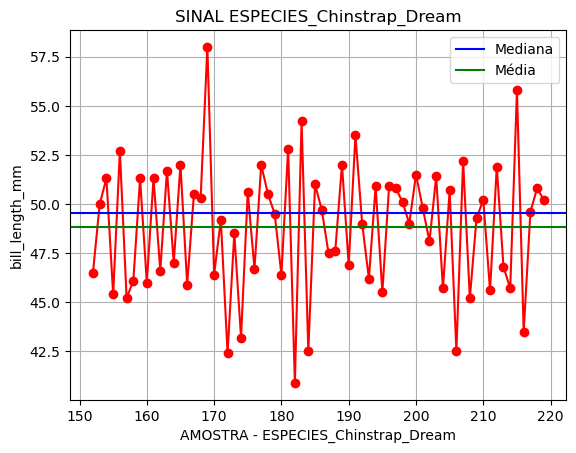

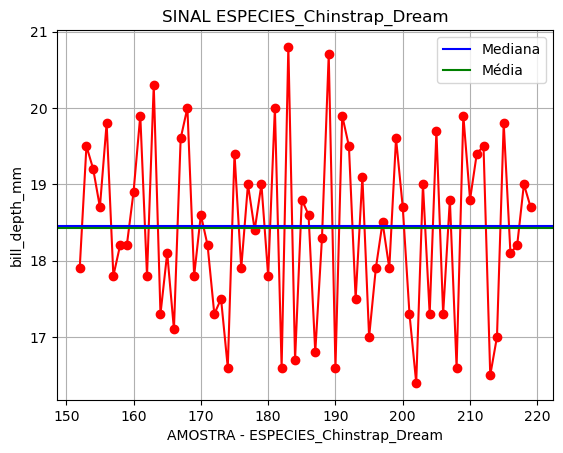

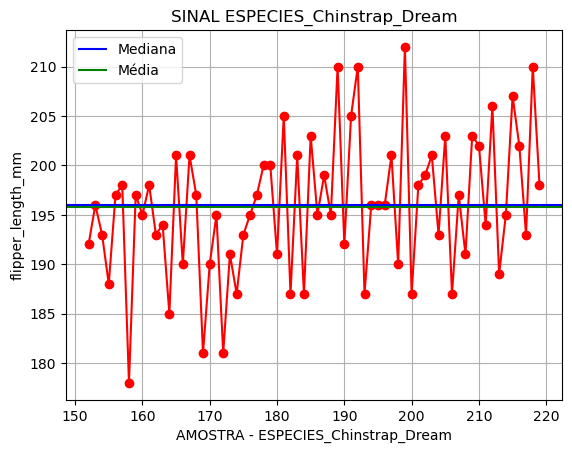

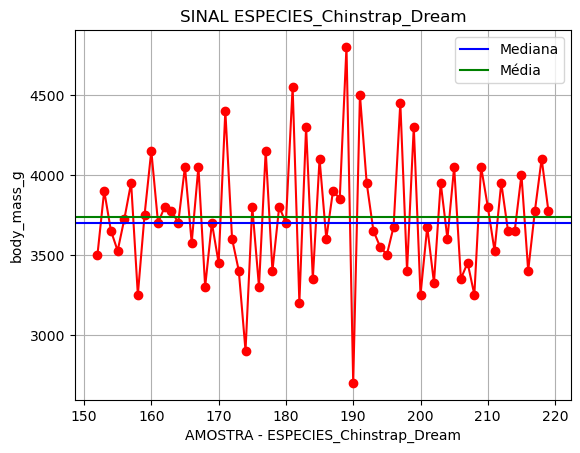

[[<Axes: title={'center': 'bill_length_mm'}>
  <Axes: title={'center': 'bill_depth_mm'}>]
 [<Axes: title={'center': 'flipper_length_mm'}>
  <Axes: title={'center': 'body_mass_g'}>]
 [<Axes: title={'center': 'posição'}> <Axes: >]]


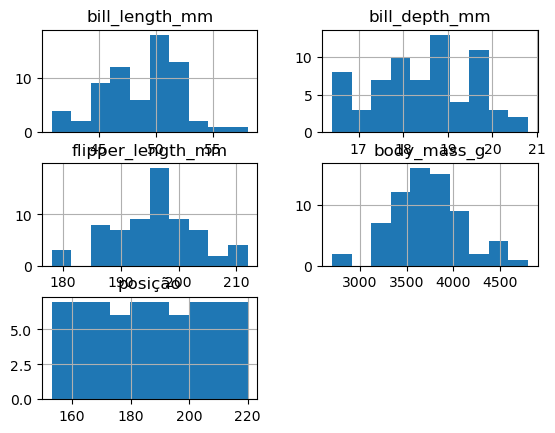

In [136]:
###################################################################################################################
print("="*80)
print("ESPECIES_Chinstrap_Dream.".center(80))
print("="*80)
for o in range(4):
    plt.plot(ESPECIES_Chinstrap_Dream[ESPECIES_Chinstrap_Dream.columns[o+2]], 'r', marker='o')
    plt.axhline(y=ESPECIES_Chinstrap_Dream[ESPECIES_Chinstrap_Dream.columns[o+2]].median(), color='b', label='Mediana')
    plt.axhline(y=ESPECIES_Chinstrap_Dream[ESPECIES_Chinstrap_Dream.columns[o+2]].mean(), color='g', label='Média')
    plt.title(f"SINAL ESPECIES_Chinstrap_Dream")
    plt.xlabel("AMOSTRA - ESPECIES_Chinstrap_Dream")
    plt.ylabel(f"{ESPECIES_Chinstrap_Dream.columns[o+2]}")
    plt.legend()
    plt.grid()
    plt.show()
print(ESPECIES_Chinstrap_Dream.hist())

#### Verificando bill_length_mm maior que 55 ou bill_length_mm menor que 45. da especie Chinstrap na ilha Dream

In [36]:
ESPECIES_Chinstrap_Dream.query("bill_length_mm > 55 or bill_length_mm < 45")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
169,2,1,58.0,17.8,181.0,3700.0,1,170
172,2,1,42.4,17.3,181.0,3600.0,1,173
174,2,1,43.2,16.6,187.0,2900.0,1,175
182,2,1,40.9,16.6,187.0,3200.0,1,183
184,2,1,42.5,16.7,187.0,3350.0,1,185
206,2,1,42.5,17.3,187.0,3350.0,1,207
215,2,1,55.8,19.8,207.0,4000.0,0,216
216,2,1,43.5,18.1,202.0,3400.0,1,217


#### Verificando bill_depth_mm maior que 20 ou bill_depth_mm menor que 17. da especie Chinstrap na ilha Dream

In [37]:
ESPECIES_Chinstrap_Dream.query("bill_depth_mm > 20 or bill_depth_mm < 17")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
163,2,1,51.7,20.3,194.0,3775.0,0,164
174,2,1,43.2,16.6,187.0,2900.0,1,175
182,2,1,40.9,16.6,187.0,3200.0,1,183
183,2,1,54.2,20.8,201.0,4300.0,0,184
184,2,1,42.5,16.7,187.0,3350.0,1,185
187,2,1,47.5,16.8,199.0,3900.0,1,188
189,2,1,52.0,20.7,210.0,4800.0,0,190
190,2,1,46.9,16.6,192.0,2700.0,1,191
202,2,1,48.1,16.4,199.0,3325.0,1,203
208,2,1,45.2,16.6,191.0,3250.0,1,209


#### Verificando flipper_length_mm maior que 210 ou flipper_length_mm menor que 185. da especie Chinstrap na ilha Dream

In [38]:
ESPECIES_Chinstrap_Dream.query("flipper_length_mm < 185 or bill_depth_mm > 210")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
158,2,1,46.1,18.2,178.0,3250.0,1,159
169,2,1,58.0,17.8,181.0,3700.0,1,170
172,2,1,42.4,17.3,181.0,3600.0,1,173


#### Verificando body_mass_g maior que 4500 ou body_mass_g menor que 3000. da especie Chinstrap na ilha Dream

In [39]:
ESPECIES_Chinstrap_Dream.query("body_mass_g > 4500 or body_mass_g < 3000")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
174,2,1,43.2,16.6,187.0,2900.0,1,175
181,2,1,52.8,20.0,205.0,4550.0,0,182
189,2,1,52.0,20.7,210.0,4800.0,0,190
190,2,1,46.9,16.6,192.0,2700.0,1,191


#### Plotando os dados da especies Chinstrap na ilha Dream, do sexo Femea.

                        ESPECIES_Chinstrap_Dream: Femea.                        
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       34.000000      34.000000          34.000000    34.000000   
mean        46.573529      17.588235         191.735294  3527.205882   
std          3.108669       0.781128           5.754096   285.333912   
min         40.900000      16.400000         178.000000  2700.000000   
25%         45.425000      17.000000         187.250000  3362.500000   
50%         46.300000      17.650000         192.000000  3550.000000   
75%         47.375000      18.050000         195.750000  3693.750000   
max         58.000000      19.400000         202.000000  4150.000000   

          posição  
count   34.000000  
mean   186.294118  
std     19.982613  
min    153.000000  
25%    170.250000  
50%    186.500000  
75%    202.750000  
max    220.000000  


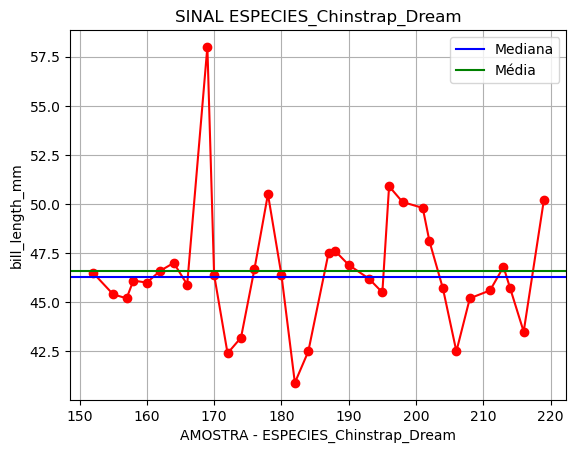

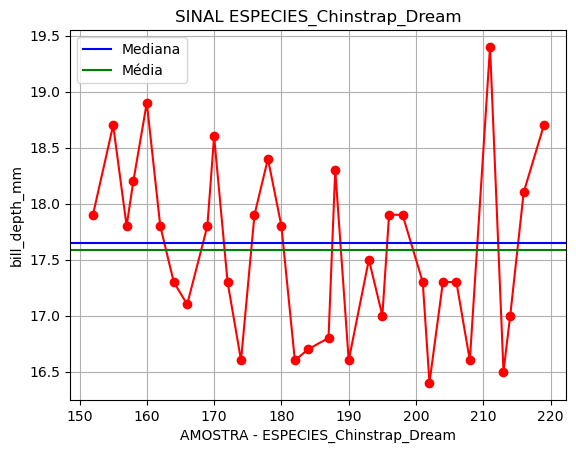

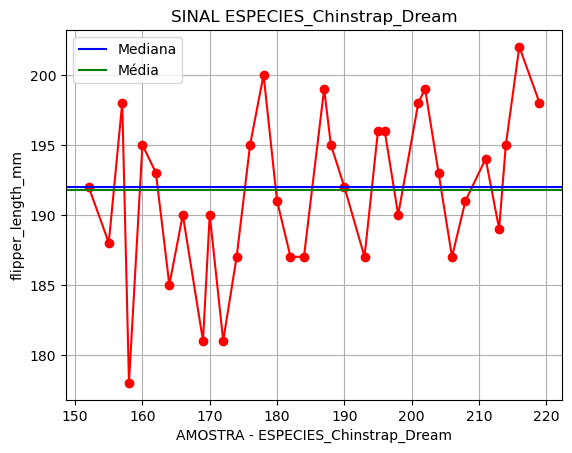

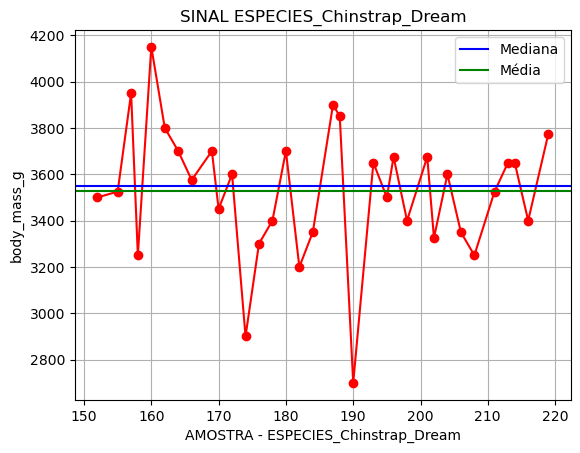

[[<Axes: title={'center': 'bill_length_mm'}>
  <Axes: title={'center': 'bill_depth_mm'}>]
 [<Axes: title={'center': 'flipper_length_mm'}>
  <Axes: title={'center': 'body_mass_g'}>]
 [<Axes: title={'center': 'posição'}> <Axes: >]]


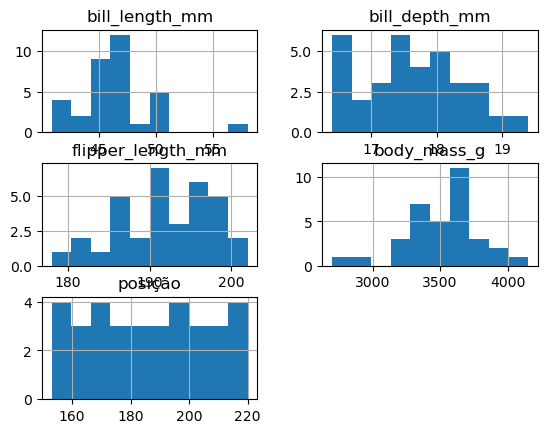

In [40]:
###################################################################################################################
print("="*80)
print("ESPECIES_Chinstrap_Dream: Femea.".center(80))
print("="*80)
    
ESPECIES_Chinstrap_Dream_copy = ESPECIES_Chinstrap_Dream
ESPECIES_Chinstrap_Dream_F = ESPECIES_Chinstrap_Dream.query("sex == 1")
print(ESPECIES_Chinstrap_Dream_F.describe())
for o in range(4):
    
    plt.plot(ESPECIES_Chinstrap_Dream_F[ESPECIES_Chinstrap_Dream.columns[o+2]], 'r', marker='o')
    plt.axhline(y=ESPECIES_Chinstrap_Dream_F[ESPECIES_Chinstrap_Dream.columns[o+2]].median(), color='b', label='Mediana')
    plt.axhline(y=ESPECIES_Chinstrap_Dream_F[ESPECIES_Chinstrap_Dream.columns[o+2]].mean(), color='g', label='Média')
    plt.title(f"SINAL ESPECIES_Chinstrap_Dream")
    plt.xlabel("AMOSTRA - ESPECIES_Chinstrap_Dream")
    plt.ylabel(f"{ESPECIES_Chinstrap_Dream.columns[o+2]}")
    plt.legend()
    plt.grid()
    plt.show()
print(ESPECIES_Chinstrap_Dream_F.hist())

#### Plotando os dados da especies Chinstrap na ilha Dream, do sexo Macho.

                        ESPECIES_Chinstrap_Dream: Macho.                        
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       34.000000      34.000000          34.000000    34.000000   
mean        51.094118      19.252941         199.911765  3938.970588   
std          1.564558       0.761273           5.976558   362.137550   
min         48.500000      17.500000         187.000000  3250.000000   
25%         50.050000      18.800000         196.000000  3731.250000   
50%         50.950000      19.300000         200.500000  3950.000000   
75%         51.975000      19.800000         203.000000  4100.000000   
max         55.800000      20.800000         212.000000  4800.000000   

          posição  
count   34.000000  
mean   186.705882  
std     19.860925  
min    154.000000  
25%    169.750000  
50%    186.500000  
75%    203.250000  
max    219.000000  


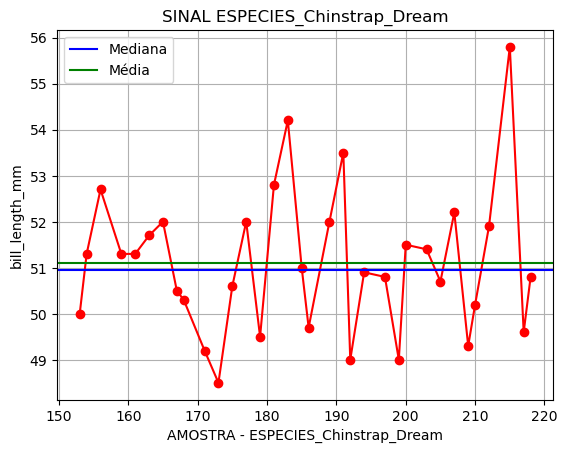

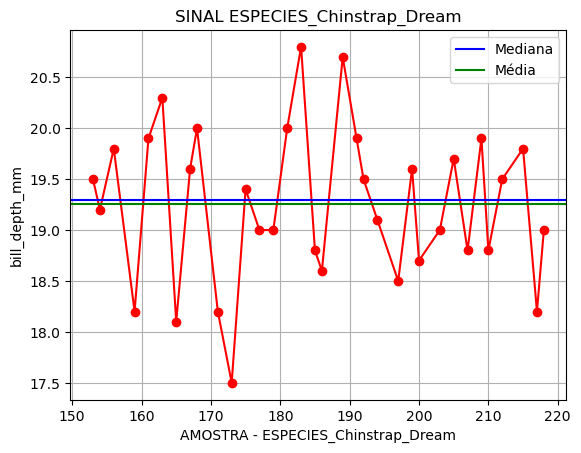

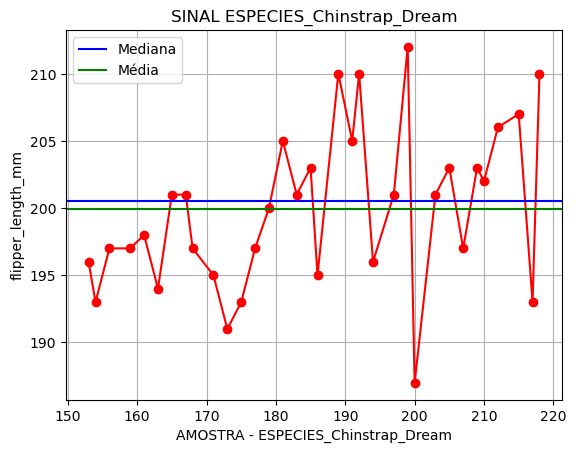

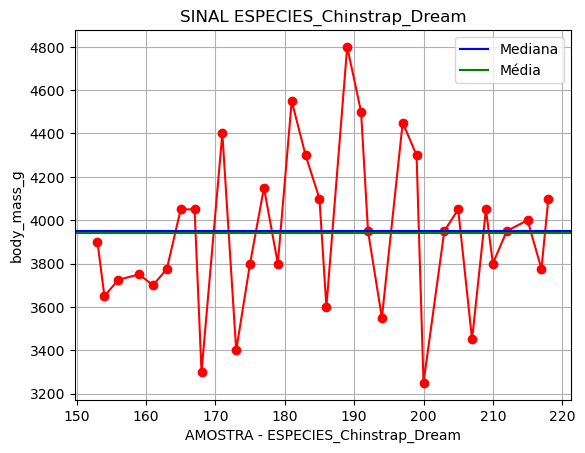

[[<Axes: title={'center': 'bill_length_mm'}>
  <Axes: title={'center': 'bill_depth_mm'}>]
 [<Axes: title={'center': 'flipper_length_mm'}>
  <Axes: title={'center': 'body_mass_g'}>]
 [<Axes: title={'center': 'posição'}> <Axes: >]]


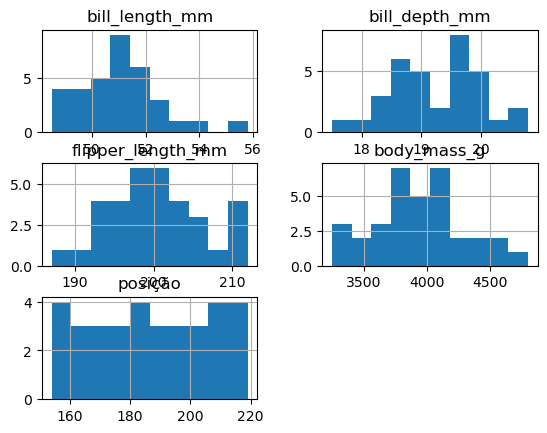

In [41]:
###################################################################################################################
print("="*80)
print("ESPECIES_Chinstrap_Dream: Macho.".center(80))
print("="*80)

ESPECIES_Chinstrap_Dream = ESPECIES_Chinstrap_Dream_copy
ESPECIES_Chinstrap_Dream_M = ESPECIES_Chinstrap_Dream.query("sex == 0")
print(ESPECIES_Chinstrap_Dream_M.describe())
for o in range(4):
    plt.plot(ESPECIES_Chinstrap_Dream_M[ESPECIES_Chinstrap_Dream.columns[o+2]], 'r', marker='o')
    plt.axhline(y=ESPECIES_Chinstrap_Dream_M[ESPECIES_Chinstrap_Dream.columns[o+2]].median(), color='b', label='Mediana')
    plt.axhline(y=ESPECIES_Chinstrap_Dream_M[ESPECIES_Chinstrap_Dream.columns[o+2]].mean(), color='g', label='Média')
    plt.title(f"SINAL ESPECIES_Chinstrap_Dream")
    plt.xlabel("AMOSTRA - ESPECIES_Chinstrap_Dream")
    plt.ylabel(f"{ESPECIES_Chinstrap_Dream.columns[o+2]}")
    plt.legend()
    plt.grid()
    plt.show()
print(ESPECIES_Chinstrap_Dream_M.hist())

#### Plotando os dados da especie Gentoo na ilha Biscoe.

                            ESPECIES_Gentoo_Biscoe.                             
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count      123.000000     123.000000         123.000000   123.000000   
mean        47.504878      14.982114         217.186992  5076.016260   
std          3.081857       0.981220           6.484976   504.116237   
min         40.900000      13.100000         203.000000  3950.000000   
25%         45.300000      14.200000         212.000000  4700.000000   
50%         47.300000      15.000000         216.000000  5000.000000   
75%         49.550000      15.700000         221.000000  5500.000000   
max         59.600000      17.300000         231.000000  6300.000000   

          posição  
count  124.000000  
mean   282.500000  
std     35.939764  
min    221.000000  
25%    251.750000  
50%    282.500000  
75%    313.250000  
max    344.000000  


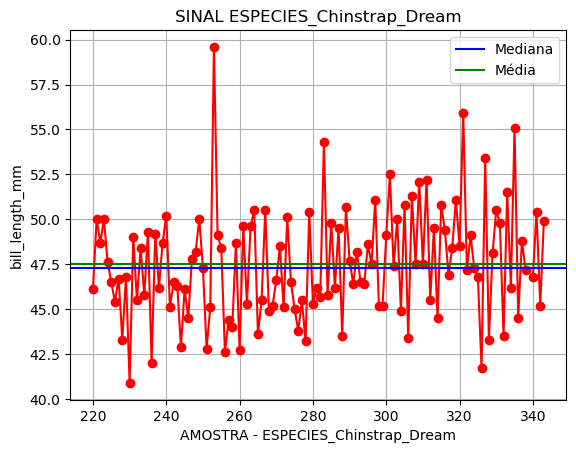

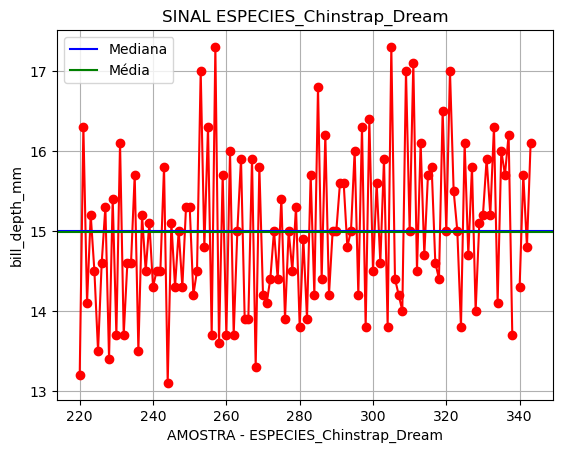

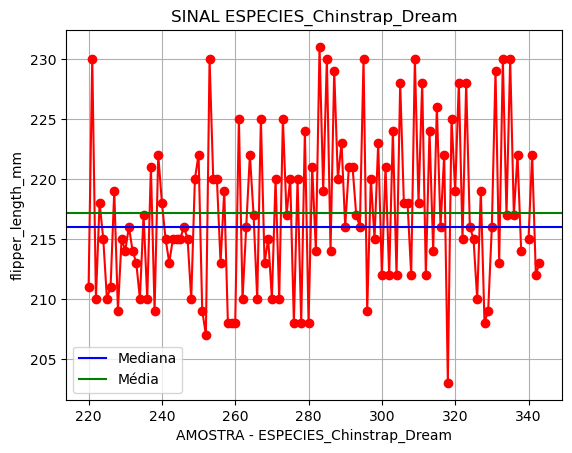

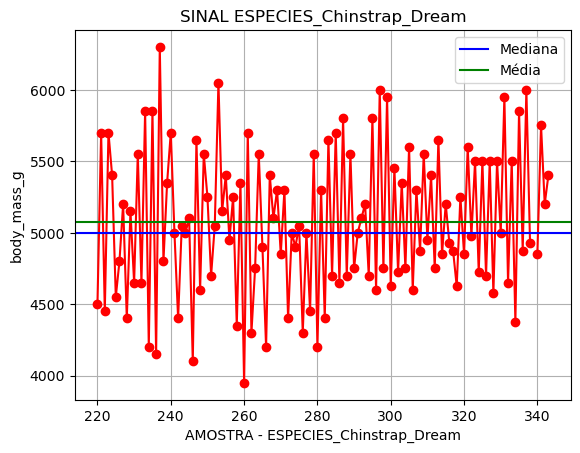

[[<Axes: title={'center': 'bill_length_mm'}>
  <Axes: title={'center': 'bill_depth_mm'}>]
 [<Axes: title={'center': 'flipper_length_mm'}>
  <Axes: title={'center': 'body_mass_g'}>]
 [<Axes: title={'center': 'posição'}> <Axes: >]]


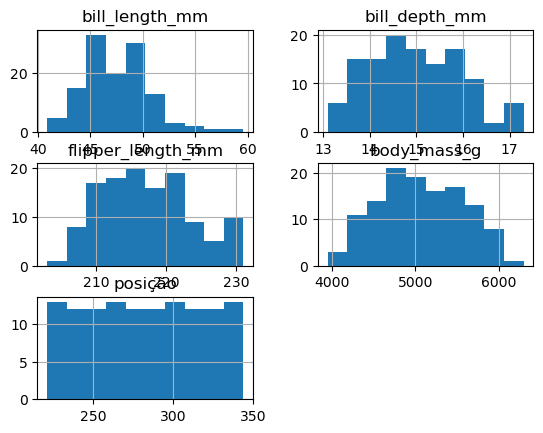

In [42]:
###################################################################################################################
print("="*80)
print("ESPECIES_Gentoo_Biscoe.".center(80))
print("="*80)
print(ESPECIES_Gentoo_Biscoe.describe())



for o in range(4):
    plt.plot(ESPECIES_Gentoo_Biscoe[ESPECIES_Gentoo_Biscoe.columns[o+2]], 'r', marker='o')
    plt.axhline(y=ESPECIES_Gentoo_Biscoe[ESPECIES_Gentoo_Biscoe.columns[o+2]].median(), color='b', label='Mediana')
    plt.axhline(y=ESPECIES_Gentoo_Biscoe[ESPECIES_Gentoo_Biscoe.columns[o+2]].mean(), color='g', label='Média')
    plt.title(f"SINAL ESPECIES_Chinstrap_Dream")
    plt.xlabel("AMOSTRA - ESPECIES_Chinstrap_Dream")
    plt.ylabel(f"{ESPECIES_Gentoo_Biscoe.columns[o+2]}")
    plt.legend()
    plt.grid()
    plt.show()
print(ESPECIES_Gentoo_Biscoe.hist())

#### Verificando bill_length_mm maior que 57. da especie Gentoo na ilha Biscoe.

In [43]:
ESPECIES_Gentoo_Biscoe.query("bill_length_mm > 57")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
253,1,0,59.6,17.0,230.0,6050.0,0,254


#### Verificando flipper_length_mm menor que 205. da especie Gentoo na ilha Biscoe.

In [44]:
ESPECIES_Gentoo_Biscoe.query("flipper_length_mm < 205")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
318,1,0,48.4,14.4,203.0,4625.0,1,319


#### Verificando body_mass_g menor que 4000 ou body_mass_g maior que 6100. da especie Gentoo na ilha Biscoe.

In [45]:
ESPECIES_Gentoo_Biscoe.query("body_mass_g < 4000 or body_mass_g > 6100")

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
237,1,0,49.2,15.2,221.0,6300.0,0,238
260,1,0,42.7,13.7,208.0,3950.0,1,261


#### Plotando os dados da especie Gentoo na ilha Biscoe. Femea

                        ESPECIES_Chinstrap_Dream: Femea.                        
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       58.000000      58.000000          58.000000    58.000000   
mean        45.563793      14.237931         212.706897  4679.741379   
std          2.051247       0.540249           3.897856   281.578294   
min         40.900000      13.100000         203.000000  3950.000000   
25%         43.850000      13.800000         210.000000  4462.500000   
50%         45.500000      14.250000         212.000000  4700.000000   
75%         46.875000      14.600000         215.000000  4875.000000   
max         50.500000      15.500000         222.000000  5200.000000   

          posição  
count   58.000000  
mean   280.931034  
std     35.796139  
min    221.000000  
25%    252.250000  
50%    280.000000  
75%    310.500000  
max    343.000000  


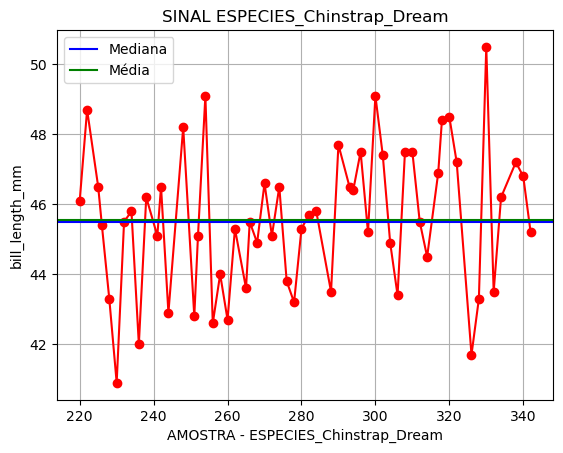

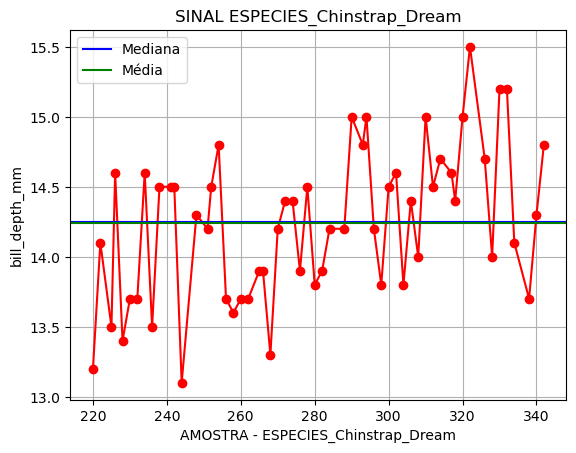

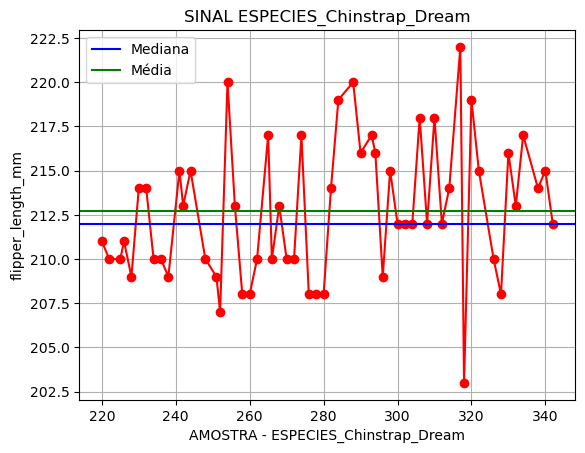

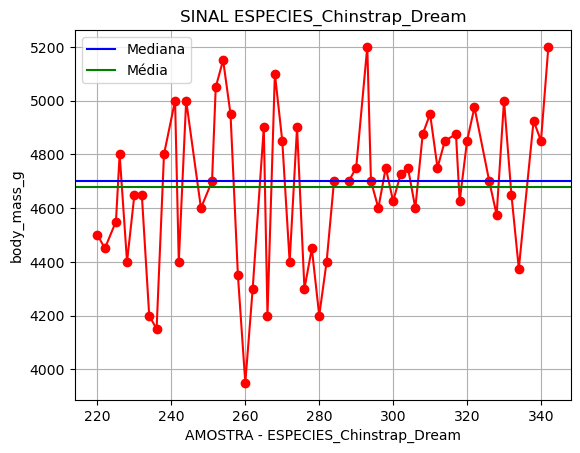

[[<Axes: title={'center': 'bill_length_mm'}>
  <Axes: title={'center': 'bill_depth_mm'}>]
 [<Axes: title={'center': 'flipper_length_mm'}>
  <Axes: title={'center': 'body_mass_g'}>]
 [<Axes: title={'center': 'posição'}> <Axes: >]]


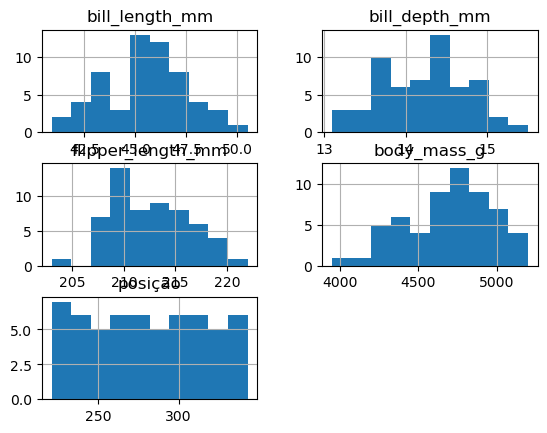

In [46]:
###################################################################################################################
print("="*80)
print("ESPECIES_Chinstrap_Dream: Femea.".center(80))
print("="*80)
    
ESPECIES_Gentoo_Biscoe_copy = ESPECIES_Gentoo_Biscoe
ESPECIES_Gentoo_Biscoe_F = ESPECIES_Gentoo_Biscoe.query("sex == 1")
print(ESPECIES_Gentoo_Biscoe_F.describe())
for o in range(4):
    
    plt.plot(ESPECIES_Gentoo_Biscoe_F[ESPECIES_Gentoo_Biscoe_F.columns[o+2]], 'r', marker='o')
    plt.axhline(y=ESPECIES_Gentoo_Biscoe_F[ESPECIES_Gentoo_Biscoe_F.columns[o+2]].median(), color='b', label='Mediana')
    plt.axhline(y=ESPECIES_Gentoo_Biscoe_F[ESPECIES_Gentoo_Biscoe_F.columns[o+2]].mean(), color='g', label='Média')
    plt.title(f"SINAL ESPECIES_Chinstrap_Dream")
    plt.xlabel("AMOSTRA - ESPECIES_Chinstrap_Dream")
    plt.ylabel(f"{ESPECIES_Gentoo_Biscoe_F.columns[o+2]}")
    plt.legend()
    plt.grid()
    plt.show()
print(ESPECIES_Gentoo_Biscoe_F.hist())

#### Plotando os dados da especie Gentoo na ilha Biscoe. Macho

                        ESPECIES_Chinstrap_Dream: Macho.                        
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       34.000000      34.000000          34.000000    34.000000   
mean        51.094118      19.252941         199.911765  3938.970588   
std          1.564558       0.761273           5.976558   362.137550   
min         48.500000      17.500000         187.000000  3250.000000   
25%         50.050000      18.800000         196.000000  3731.250000   
50%         50.950000      19.300000         200.500000  3950.000000   
75%         51.975000      19.800000         203.000000  4100.000000   
max         55.800000      20.800000         212.000000  4800.000000   

          posição  
count   34.000000  
mean   186.705882  
std     19.860925  
min    154.000000  
25%    169.750000  
50%    186.500000  
75%    203.250000  
max    219.000000  


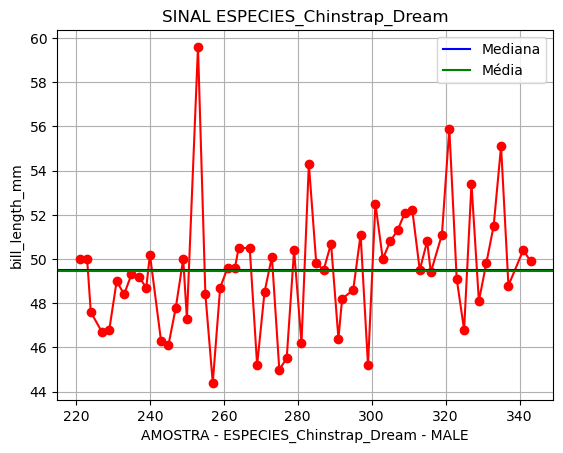

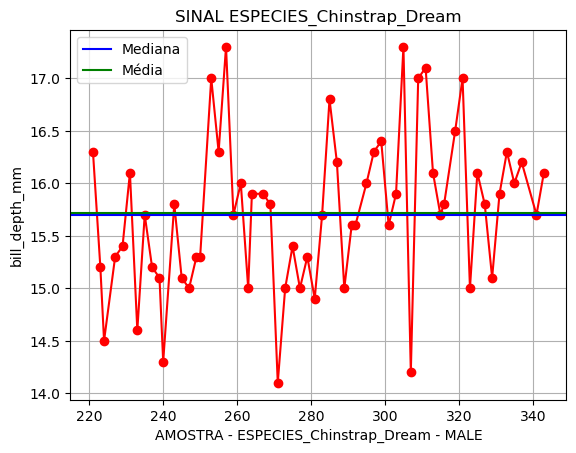

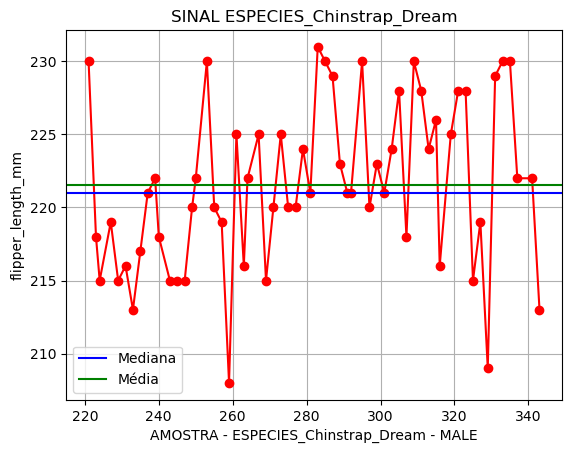

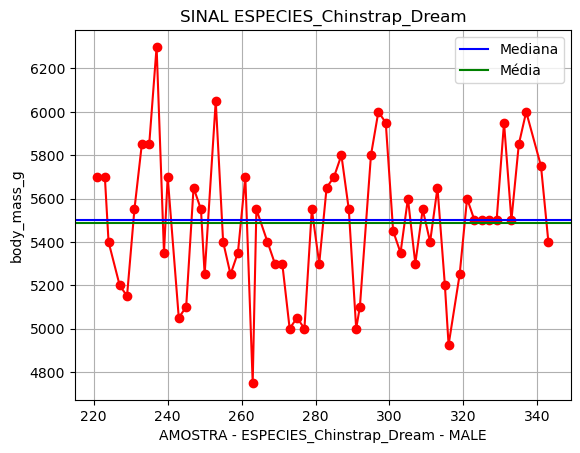

[[<Axes: title={'center': 'bill_length_mm'}>
  <Axes: title={'center': 'bill_depth_mm'}>]
 [<Axes: title={'center': 'flipper_length_mm'}>
  <Axes: title={'center': 'body_mass_g'}>]
 [<Axes: title={'center': 'posição'}> <Axes: >]]


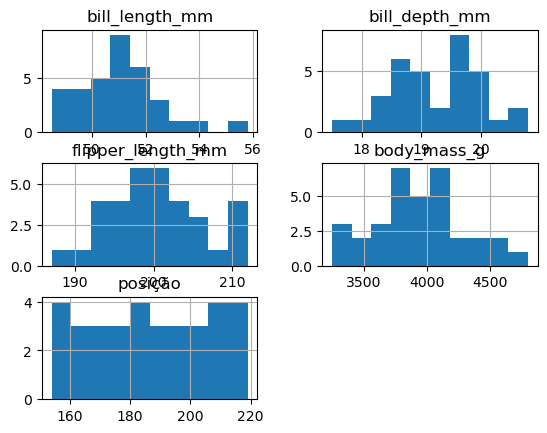

In [47]:
###################################################################################################################
print("="*80)
print("ESPECIES_Chinstrap_Dream: Macho.".center(80))
print("="*80)

ESPECIES_Gentoo_Biscoe = ESPECIES_Gentoo_Biscoe_copy
ESPECIES_Gentoo_Biscoe_M = ESPECIES_Gentoo_Biscoe.query("sex == 0")
print(ESPECIES_Chinstrap_Dream_M.describe())
for o in range(4):
    plt.plot(ESPECIES_Gentoo_Biscoe_M[ESPECIES_Gentoo_Biscoe_M.columns[o+2]], 'r', marker='o')
    plt.axhline(y=ESPECIES_Gentoo_Biscoe_M[ESPECIES_Gentoo_Biscoe_M.columns[o+2]].median(), color='b', label='Mediana')
    plt.axhline(y=ESPECIES_Gentoo_Biscoe_M[ESPECIES_Gentoo_Biscoe_M.columns[o+2]].mean(), color='g', label='Média')
    plt.title(f"SINAL ESPECIES_Chinstrap_Dream")
    plt.xlabel("AMOSTRA - ESPECIES_Chinstrap_Dream - MALE")
    plt.ylabel(f"{ESPECIES_Chinstrap_Dream.columns[o+2]}")
    plt.legend()
    plt.grid()
    plt.show()
print(ESPECIES_Chinstrap_Dream_M.hist())

#### Plotando os dados da especie Adelie na ilha Biscoe.

                                ESPECIES_Adelie.                                
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       44.000000      44.000000          44.000000    44.000000   
mean        38.975000      18.370455         188.795455  3709.659091   
std          2.480916       1.188820           6.729247   487.733722   
min         34.500000      16.000000         172.000000  2850.000000   
25%         37.675000      17.650000         184.750000  3387.500000   
50%         38.700000      18.450000         189.500000  3750.000000   
75%         40.700000      19.025000         193.000000  3975.000000   
max         45.600000      21.100000         203.000000  4775.000000   

          posição  
count   44.000000  
mean    69.590909  
std     32.850131  
min     21.000000  
25%     51.750000  
50%     62.500000  
75%    105.250000  
max    116.000000  


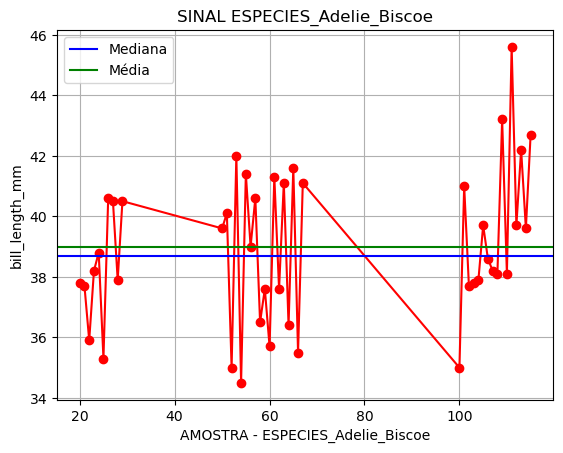

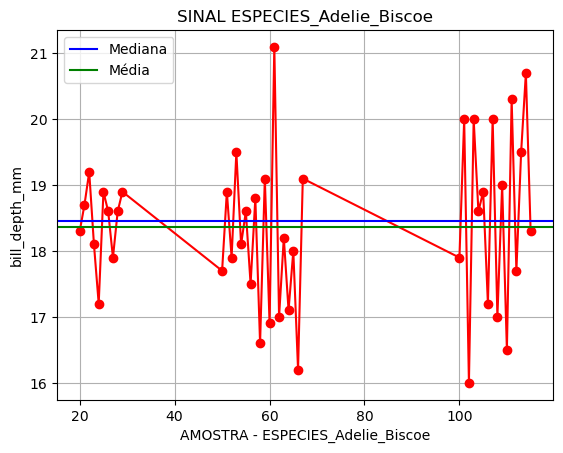

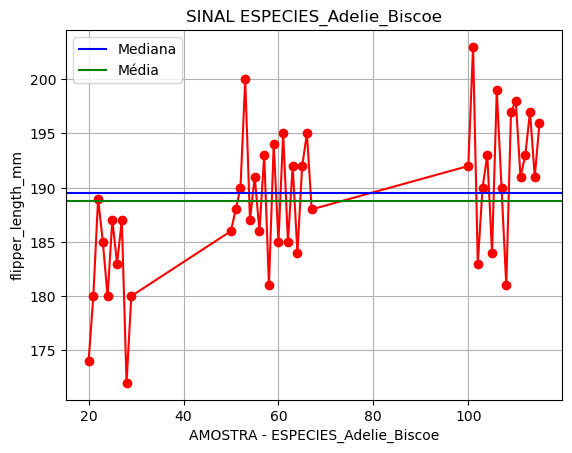

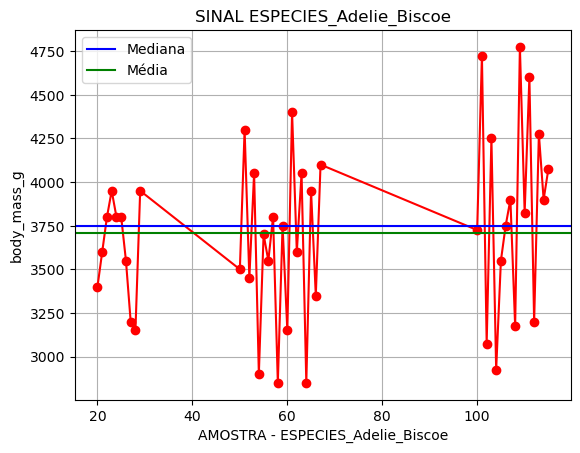

[[<Axes: title={'center': 'bill_length_mm'}>
  <Axes: title={'center': 'bill_depth_mm'}>]
 [<Axes: title={'center': 'flipper_length_mm'}>
  <Axes: title={'center': 'body_mass_g'}>]
 [<Axes: title={'center': 'posição'}> <Axes: >]]


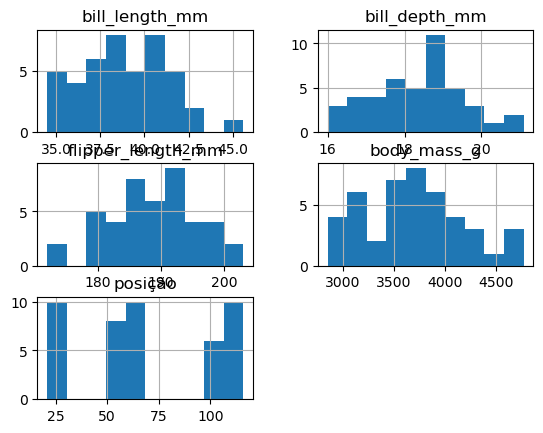

In [48]:
###################################################################################################################
print("="*80)
print("ESPECIES_Adelie.".center(80))
print("="*80)
print(ESPECIES_Adelie_Biscoe.describe())



for o in range(4):
    plt.plot(ESPECIES_Adelie_Biscoe[ESPECIES_Adelie_Biscoe.columns[o+2]], 'r', marker='o')
    plt.axhline(y=ESPECIES_Adelie_Biscoe[ESPECIES_Adelie_Biscoe.columns[o+2]].median(), color='b', label='Mediana')
    plt.axhline(y=ESPECIES_Adelie_Biscoe[ESPECIES_Adelie_Biscoe.columns[o+2]].mean(), color='g', label='Média')
    plt.title(f"SINAL ESPECIES_Adelie_Biscoe")
    plt.xlabel("AMOSTRA - ESPECIES_Adelie_Biscoe")
    plt.ylabel(f"{ESPECIES_Adelie_Biscoe.columns[o+2]}")
    plt.legend()
    plt.grid()
    plt.show()
print(ESPECIES_Adelie_Biscoe.hist())

#### Plotando os dados da especie Adelie na ilha Biscoe. Femea

                         ESPECIES_Adelie_Biscoe: Femea.                         
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       22.000000      22.000000          22.000000    22.000000   
mean        37.359091      17.704545         187.181818  3369.318182   
std          1.762212       1.091298           6.744567   343.470715   
min         34.500000      16.000000         172.000000  2850.000000   
25%         35.750000      17.000000         184.250000  3150.000000   
50%         37.750000      17.700000         187.000000  3375.000000   
75%         38.475000      18.250000         191.750000  3693.750000   
max         40.500000      20.700000         199.000000  3900.000000   

          posição  
count   22.000000  
mean    69.181818  
std     33.112559  
min     21.000000  
25%     51.500000  
50%     62.000000  
75%    104.500000  
max    115.000000  


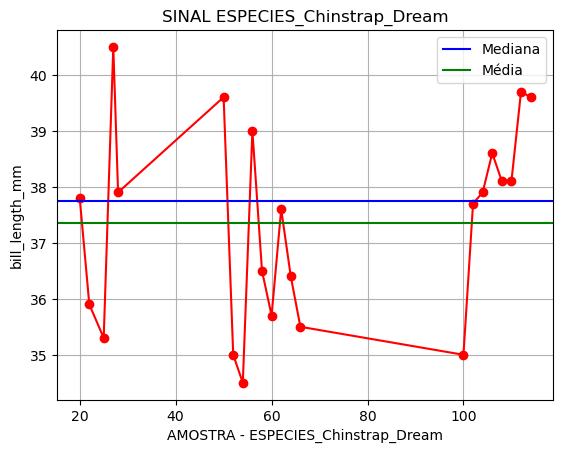

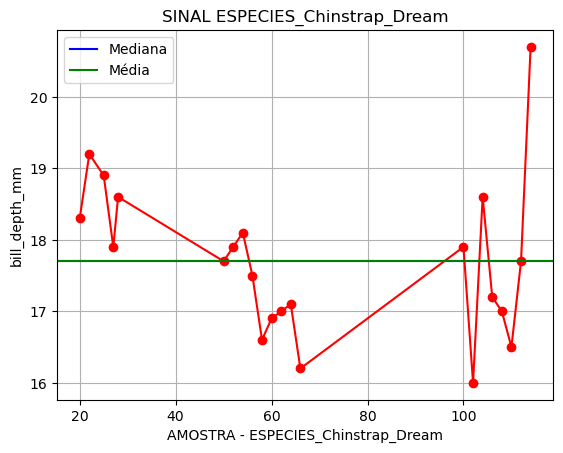

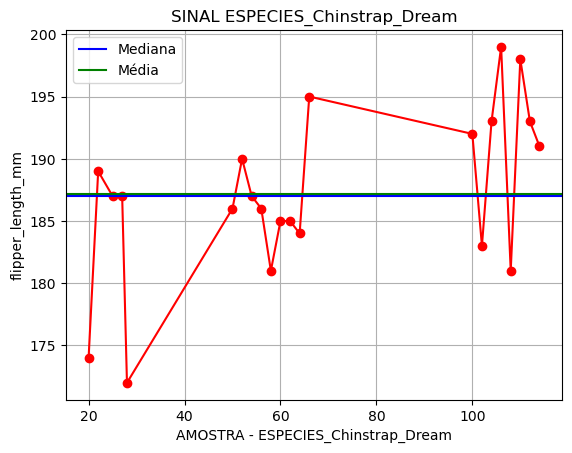

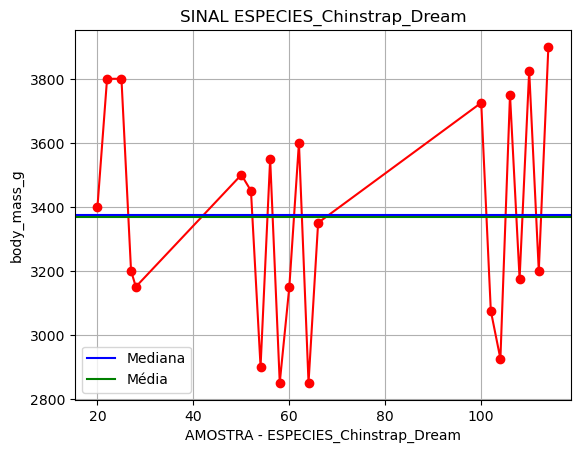

[[<Axes: title={'center': 'bill_length_mm'}>
  <Axes: title={'center': 'bill_depth_mm'}>]
 [<Axes: title={'center': 'flipper_length_mm'}>
  <Axes: title={'center': 'body_mass_g'}>]
 [<Axes: title={'center': 'posição'}> <Axes: >]]


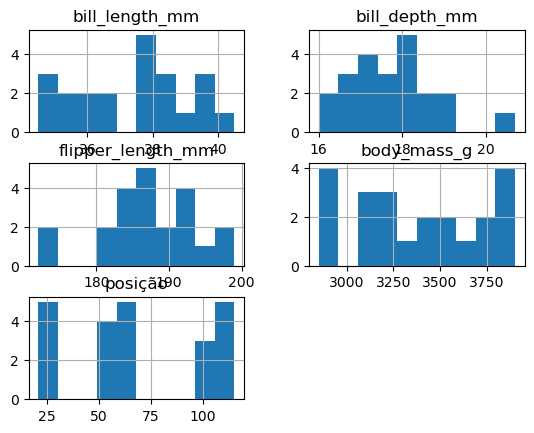

In [49]:
###################################################################################################################
print("="*80)
print("ESPECIES_Adelie_Biscoe: Femea.".center(80))
print("="*80)
    
ESPECIES_Adelie_Biscoe_copy = ESPECIES_Adelie_Biscoe
ESPECIES_Adelie_Biscoe_F = ESPECIES_Adelie_Biscoe.query("sex == 1")
print(ESPECIES_Adelie_Biscoe_F.describe())
for o in range(4):
    
    plt.plot(ESPECIES_Adelie_Biscoe_F[ESPECIES_Adelie_Biscoe_F.columns[o+2]], 'r', marker='o')
    plt.axhline(y=ESPECIES_Adelie_Biscoe_F[ESPECIES_Adelie_Biscoe_F.columns[o+2]].median(), color='b', label='Mediana')
    plt.axhline(y=ESPECIES_Adelie_Biscoe_F[ESPECIES_Adelie_Biscoe_F.columns[o+2]].mean(), color='g', label='Média')
    plt.title(f"SINAL ESPECIES_Chinstrap_Dream")
    plt.xlabel("AMOSTRA - ESPECIES_Chinstrap_Dream")
    plt.ylabel(f"{ESPECIES_Adelie_Biscoe_F.columns[o+2]}")
    plt.legend()
    plt.grid()
    plt.show()
print(ESPECIES_Adelie_Biscoe_F.hist())

#### Plotando os dados da especie Adelie na ilha Biscoe. Macho.

                         ESPECIES_Adelie_Biscoe: Macho.                         
       bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  \
count       34.000000      34.000000          34.000000    34.000000   
mean        51.094118      19.252941         199.911765  3938.970588   
std          1.564558       0.761273           5.976558   362.137550   
min         48.500000      17.500000         187.000000  3250.000000   
25%         50.050000      18.800000         196.000000  3731.250000   
50%         50.950000      19.300000         200.500000  3950.000000   
75%         51.975000      19.800000         203.000000  4100.000000   
max         55.800000      20.800000         212.000000  4800.000000   

          posição  
count   34.000000  
mean   186.705882  
std     19.860925  
min    154.000000  
25%    169.750000  
50%    186.500000  
75%    203.250000  
max    219.000000  


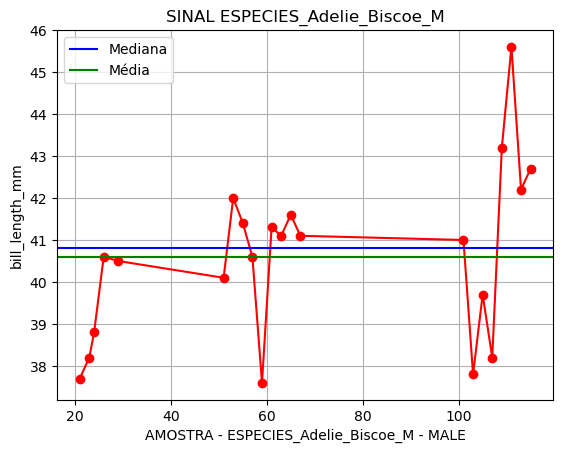

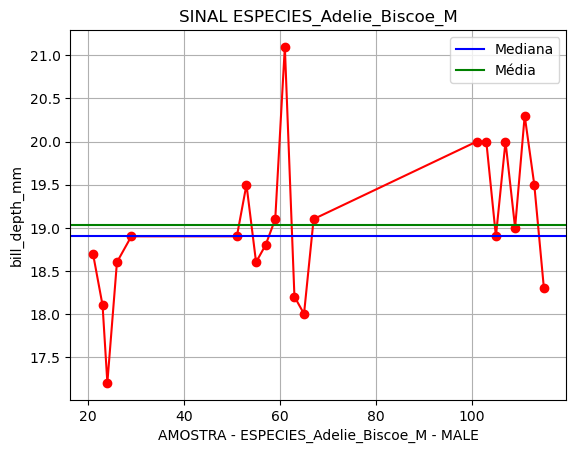

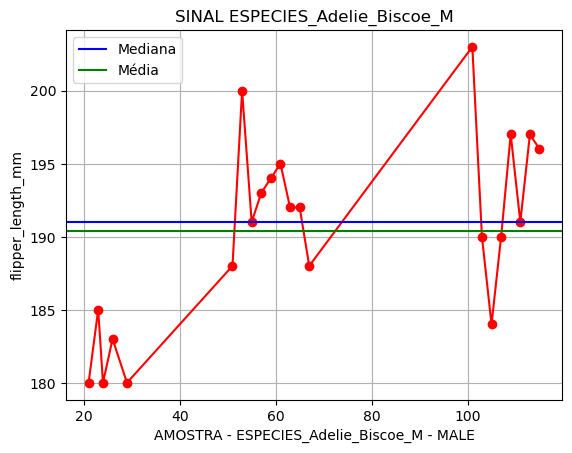

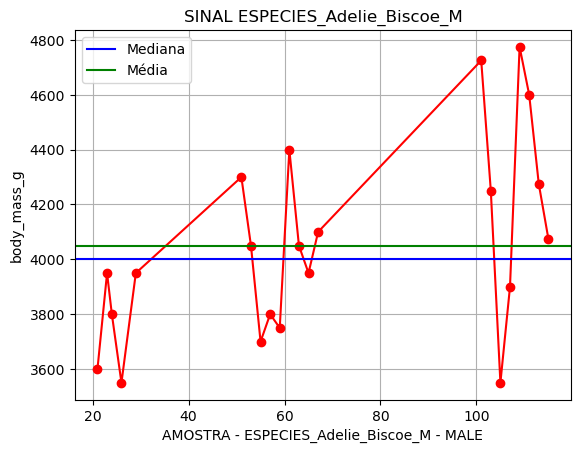

[[<Axes: title={'center': 'bill_length_mm'}>
  <Axes: title={'center': 'bill_depth_mm'}>]
 [<Axes: title={'center': 'flipper_length_mm'}>
  <Axes: title={'center': 'body_mass_g'}>]
 [<Axes: title={'center': 'posição'}> <Axes: >]]


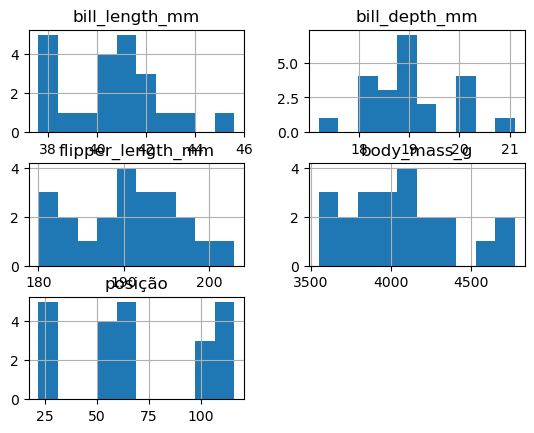

In [50]:
###################################################################################################################
print("="*80)
print("ESPECIES_Adelie_Biscoe: Macho.".center(80))
print("="*80)

ESPECIES_Adelie_Biscoe = ESPECIES_Adelie_Biscoe_copy
ESPECIES_Adelie_Biscoe_M = ESPECIES_Adelie_Biscoe.query("sex == 0")
print(ESPECIES_Chinstrap_Dream_M.describe())
for o in range(4):
    plt.plot(ESPECIES_Adelie_Biscoe_M[ESPECIES_Adelie_Biscoe_M.columns[o+2]], 'r', marker='o')
    plt.axhline(y=ESPECIES_Adelie_Biscoe_M[ESPECIES_Adelie_Biscoe_M.columns[o+2]].median(), color='b', label='Mediana')
    plt.axhline(y=ESPECIES_Adelie_Biscoe_M[ESPECIES_Adelie_Biscoe_M.columns[o+2]].mean(), color='g', label='Média')
    plt.title(f"SINAL ESPECIES_Adelie_Biscoe_M")
    plt.xlabel("AMOSTRA - ESPECIES_Adelie_Biscoe_M - MALE")
    plt.ylabel(f"{ESPECIES_Adelie_Biscoe_M.columns[o+2]}")
    plt.legend()
    plt.grid()
    plt.show()
print(ESPECIES_Adelie_Biscoe_M.hist())

In [ ]:


# # permite modificar os parametros padros
# # matplot lib. Combina com numpy
# # update para atualizar os paramsn
# # pylab.rcParams.update(params)

# # ciborne lib. grafico de densidade.
# # hist = oculta hisgrama.
# # kde exibe as linhas.

# sns.distplot(ESPECIES_Chinstrap_Dream_M[ESPECIES_Chinstrap_Dream.columns[0+2]], hist = False, kde = True, color = 'red', label = 'x1')
# sns.distplot(ESPECIES_Chinstrap_Dream_M[ESPECIES_Chinstrap_Dream.columns[1+2]], hist = False, kde = True, color = 'green', label = 'x2')
# #sns.distplot(ESPECIES_Chinstrap_Dream_M[ESPECIES_Chinstrap_Dream.columns[2+2]], hist = False, kde = True, color = 'blue', label = 'x3')
# #sns.distplot(ESPECIES_Chinstrap_Dream_M[ESPECIES_Chinstrap_Dream.columns[3+2]], hist = False, kde = True, color = 'cyan', label = 'x4')

# plt.legend(fontsize = 20)
# plt.ylabel("Densidade")
# plt.xlabel("Variáveis")
# plt.suptitle('Distribuição Original', size = 20)
# plt.show()

lista = list(range(1, len(ESPECIES_Chinstrap_Dream), 1))

ESPECIES_Chinstrap_Dream[ESPECIES_Chinstrap_Dream.columns[2]].plot.scatter(lista, ESPECIES_Chinstrap_Dream.columns[2], color='b', label='Penguins')

In [ ]:
# sns.heatmap(ESPECIES_Chinstrap_Dream.corr(), fmt=".2f", annot=True, center=0.0)

In [51]:
fig = px.scatter(ESPECIES_Chinstrap_Dream, x='bill_depth_mm', y='bill_length_mm',title="Penguins", color='body_mass_g')
fig.show()

In [52]:
fig = px.scatter_3d(ESPECIES_Chinstrap_Dream, x='bill_length_mm', y='bill_depth_mm', z='body_mass_g',title="Penguins", color='flipper_length_mm')
fig.show()

## 3)Tratamentos dos dados.

In [53]:
# Percorrendo por todos os erros.
for i in range(len(initial_data.iloc[row])):

    # Se a amostra for da especie: 0 - Adelie
    if(initial_data['species'].iloc[row[i]] == 0):
        # Se a epecie for da ilha: 1 - Dream    
        if(initial_data['island'].iloc[row[i]] == 1):
            print(initial_data.iloc[row[i]])
            """
            ESPECIES_Adelie_Dream.query("body_mass_g <= 3600  and bill_length_mm < 40.6")  # femea 
            
            """
            if(pd.isnull(initial_data['sex'].iloc[row[i]])):
                if((initial_data['body_mass_g'].iloc[row[i]] < 3700) and (initial_data['bill_length_mm'].iloc[row[i]] < 40.6)):
                    initial_data.at[row[i] , 'sex'] = int(1)
                    print("\n\tFemea\n")

            # percorre 6 colunas, a sexo será tratada em outra metodo
            """
            for a in range(6):
                # Se a coluna estiver nula
                if(pd.isnull(initial_data.iloc[row[i]].iloc[a])):
                    print("\n\n")
                    print(initial_data.iloc[row[i]].iloc[a])
                    # ESPECIES_Adelie_Dream.describe().loc['mean', ESPECIES_Adelie_Dream.columns[2]]
            """


        # Se a epecie for da ilha: 2 - Torgersen 
        if(initial_data['island'].iloc[row[i]] == 2):
            print(initial_data.iloc[row[i]])
            """
                Definir o sexo para os que tem valores. validos
                macho ESPECIES_Adelie_Torgersen.query("bill_depth_mm > 19.3") 
                femea ESPECIES_Adelie_Torgersen.query("bill_depth_mm < 19.3 and bill_length_mm < 37.9")

            """
            if(pd.isnull(initial_data['sex'].iloc[row[i]])):
                if(initial_data['bill_depth_mm'].iloc[row[i]] > 19.3):
                    initial_data.at[row[i] , 'sex'] = int(0)
                    # print("\n\tMacho\n")
                if((initial_data['bill_depth_mm'].iloc[row[i]] < 19.3) and (initial_data['bill_length_mm'].iloc[row[i]] < 37.9) and (initial_data['bill_length_mm'].iloc[row[i]] > 0 )):
                    initial_data.at[row[i] , 'sex'] = int(1)
                    # print(f"\n\tFemea: {initial_data['sex'].iloc[row[i]]}\n")

            # percorre 6 colunas, a sexo será tratada em outra metodo
            # incluir valores.
            for a in range(6):
                # Se a coluna estiver nula
                if(pd.isnull(initial_data.iloc[row[i]].iloc[a])):
                    # print("\n\n")
                    initial_data.at[row[i] , initial_data.columns[a]] = ESPECIES_Adelie_Torgersen.describe().loc['mean', ESPECIES_Adelie_Torgersen.columns[a]]
                    # print(initial_data.iloc[row[i]].iloc[a])

            if(pd.isnull(initial_data['sex'].iloc[row[i]])):
                if((initial_data['bill_depth_mm'].iloc[row[i]] > 18.4)  and  (initial_data['body_mass_g'].iloc[row[i]] >= 3650) and (initial_data['species'].iloc[row[i]] == 0) and (initial_data['island'].iloc[row[i]] == 2)):
                    initial_data.at[row[i] , 'sex'] = int(0)
                    print("\n\tMacho\n")
                if((initial_data['bill_depth_mm'].iloc[row[i]] < 19.3) and (initial_data['bill_length_mm'].iloc[row[i]] < 37.9) and (initial_data['bill_length_mm'].iloc[row[i]] > 0 )):
                    initial_data.at[row[i] , 'sex'] = int(1)
                    print(f"\n\tFemea: {initial_data['sex'].iloc[row[i]]}\n")
            


    # Se a amostra for da especie: 1 - Gentoo
    if(initial_data['species'].iloc[row[i]] == 1):

        # Se a epecie for da ilha: 0 - Biscoe 
        if(initial_data['island'].iloc[row[i]] == 0):
            print(initial_data.iloc[row[i]])
            """ 
                ESPECIES_Gentoo_Biscoe.query("bill_depth_mm > 15.50") macho 
                ESPECIES_Gentoo_Biscoe.query("bill_depth_mm < 15.50 and  body_mass_g < 4750") femea.
            """
            if(pd.isnull(initial_data['sex'].iloc[row[i]])):
                if((initial_data['bill_depth_mm'].iloc[row[i]] > 15.50)):
                    initial_data.at[row[i] , 'sex'] = int(0)
                    print("\n\tMacho\n")
                if((initial_data['bill_depth_mm'].iloc[row[i]] < 15.50) and (initial_data['body_mass_g'].iloc[row[i]] < 4750)):
                    initial_data.at[row[i] , 'sex'] = int(1)
                    print("\n\tFemea\n")
            
            # percorre 6 colunas, a sexo será tratada em outra metodo
            for a in range(6):
                # Se a coluna estiver nula
                if(pd.isnull(initial_data.iloc[row[i]].iloc[a])):
                    print("\n\n")
                    initial_data.at[row[i] , initial_data.columns[a]] = ESPECIES_Gentoo_Biscoe.describe().loc['mean', ESPECIES_Gentoo_Biscoe.columns[a]]
                    print(initial_data.iloc[row[i]].iloc[a])
                    # ESPECIES_Gentoo_Biscoe.describe().loc['mean', ESPECIES_Gentoo_Biscoe.columns[a]]
            
            if(pd.isnull(initial_data['sex'].iloc[row[i]])):
                if((initial_data['bill_depth_mm'].iloc[row[i]] > 14.7)):
                    initial_data.at[row[i] , 'sex'] = int(0)
                    print("\n\tMacho\n")
                if((initial_data['bill_depth_mm'].iloc[row[i]] < 14.7) and (initial_data['body_mass_g'].iloc[row[i]] < 4750)):
                    initial_data.at[row[i] , 'sex'] = int(1)
                    print("\n\tFemea\n")
                    
                    # 339	1	0	47.504878	14.982114	217.186992	5076.016260	NaN
            


species                0
island                 2
bill_length_mm       NaN
bill_depth_mm        NaN
flipper_length_mm    NaN
body_mass_g          NaN
sex                  NaN
posição                4
Name: 3, dtype: object

	Macho

species                   0
island                    2
bill_length_mm         34.1
bill_depth_mm          18.1
flipper_length_mm     193.0
body_mass_g          3475.0
sex                     NaN
posição                   9
Name: 8, dtype: object
species                   0
island                    2
bill_length_mm         42.0
bill_depth_mm          20.2
flipper_length_mm     190.0
body_mass_g          4250.0
sex                     NaN
posição                  10
Name: 9, dtype: object
species                   0
island                    2
bill_length_mm         37.8
bill_depth_mm          17.1
flipper_length_mm     186.0
body_mass_g          3300.0
sex                     NaN
posição                  11
Name: 10, dtype: object
species                   

Convertendo os dados do tipo objeto para inteiro.

In [54]:
initial_data['species'] = initial_data['species'].astype(int)
initial_data['island'] = initial_data['island'].astype(int)
initial_data['sex'] = initial_data['sex'].astype(int)

### Dado tratados. 

In [55]:
initial_data.iloc[row]

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
3,0,2,38.950980,18.429412,191.196078,3706.372549,0,4
8,0,2,34.100000,18.100000,193.000000,3475.000000,1,9
9,0,2,42.000000,20.200000,190.000000,4250.000000,0,10
10,0,2,37.800000,17.100000,186.000000,3300.000000,1,11
11,0,2,37.800000,17.300000,180.000000,3700.000000,1,12
47,0,1,37.500000,18.900000,179.000000,2975.000000,1,48
246,1,0,44.500000,14.300000,216.000000,4100.000000,1,247
286,1,0,46.200000,14.400000,214.000000,4650.000000,1,287
324,1,0,47.300000,13.800000,216.000000,4725.000000,1,325
336,1,0,44.500000,15.700000,217.000000,4875.000000,0,337


#### Toda base de dados.

In [56]:
fig = px.scatter_3d(initial_data, x='bill_length_mm', y='bill_depth_mm', z='body_mass_g',title="Penguins", color='flipper_length_mm')
fig.show()

In [57]:
initial_data

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
0,0,2,39.100000,18.700000,181.000000,3750.000000,0,1
1,0,2,39.500000,17.400000,186.000000,3800.000000,1,2
2,0,2,40.300000,18.000000,195.000000,3250.000000,1,3
3,0,2,38.950980,18.429412,191.196078,3706.372549,0,4
4,0,2,36.700000,19.300000,193.000000,3450.000000,1,5
...,...,...,...,...,...,...,...,...
339,1,0,47.504878,14.982114,217.186992,5076.016260,0,340
340,1,0,46.800000,14.300000,215.000000,4850.000000,1,341
341,1,0,50.400000,15.700000,222.000000,5750.000000,0,342
342,1,0,45.200000,14.800000,212.000000,5200.000000,1,343


#### Soma dos valores nulos no dataframe.

In [61]:
initial_data.isnull().sum()

species              0
island               0
bill_length_mm       0
bill_depth_mm        0
flipper_length_mm    0
body_mass_g          0
sex                  0
posição              0
dtype: int64

In [62]:
initial_data.dtypes

species                int32
island                 int32
bill_length_mm       float64
bill_depth_mm        float64
flipper_length_mm    float64
body_mass_g          float64
sex                    int32
posição                int64
dtype: object

## 4)Mineração dos dados.

In [63]:
initial_data.describe(include='all')

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
count,344.000000,344.000000,344.000000,344.000000,344.000000,344.000000,344.000000,344.000000
mean,0.755814,0.662791,43.917895,17.148580,200.934253,4202.855781,0.500000,172.500000
std,0.762626,0.726194,5.453687,1.973713,14.057944,801.450975,0.500728,99.448479
min,0.000000,0.000000,32.100000,13.100000,172.000000,2700.000000,0.000000,1.000000
25%,0.000000,0.000000,39.200000,15.575000,190.000000,3550.000000,0.000000,86.750000
50%,1.000000,1.000000,44.450000,17.300000,197.000000,4050.000000,0.500000,172.500000
75%,1.000000,1.000000,48.500000,18.700000,213.250000,4756.250000,1.000000,258.250000
max,2.000000,2.000000,59.600000,21.500000,231.000000,6300.000000,1.000000,344.000000


#### Criando uma matriz com valores estatisticos.

In [64]:
print("------------------------------------------------")
print("\tExtraindo os valores dos dados coletados.")
"""
    Extraindo os seguintes valores.
        0 - Media
        1 - Mediana.
        2 - Desvio Padrão.
        3 - Variancia
        4 - Valor Minimo.
        5 - Valor maximo.
        6 - Amplitute.
        7 - Coeficiente da Variação.
        8 - Escore Z
        9 - Soma total.
"""
minerados = []

minerados.append(np.average(initial_data))
minerados.append(np.median(initial_data))
minerados.append(np.std(initial_data))
minerados.append(np.var(initial_data))
minerados.append(min(initial_data))
minerados.append(max(initial_data))
#minerados.append((max(initial_data) - min(initial_data)))
minerados.append((np.std(initial_data) / np.average(initial_data)))
#minerados.append(stats.zscore(initial_data))
minerados.append(np.sum(initial_data))
minerados

------------------------------------------------
	Extraindo os valores dos dados coletados.


[579.9093892672639,
 20.0,
 species                0.761517
 island                 0.725138
 bill_length_mm         5.445755
 bill_depth_mm          1.970842
 flipper_length_mm     14.037496
 body_mass_g          800.285227
 sex                    0.500000
 posição               99.303827
 dtype: float64,
 species                   0.579908
 island                    0.525825
 bill_length_mm           29.656244
 bill_depth_mm             3.884218
 flipper_length_mm       197.051304
 body_mass_g          640456.444944
 sex                       0.250000
 posição                9861.250000
 dtype: float64,
 'bill_depth_mm',
 'species',
 species              0.001313
 island               0.001250
 bill_length_mm       0.009391
 bill_depth_mm        0.003399
 flipper_length_mm    0.024206
 body_mass_g          1.380018
 sex                  0.000862
 posição              0.171240
 dtype: float64,
 species              2.600000e+02
 island               2.280000e+02
 bill_length_mm       

## Árvore de desição.

In [66]:
clf = DecisionTreeClassifier(criterion="entropy") #entropia é uma medida de caoticidade/'bagunça',
                                                    #utilizada para medir a mistura das classes dentro de uma regra,
                                                    #veremos ela logo
        
        
# removendo valores, deixando apenas atributos relevantes.       
initial_dataAtributos = initial_data.drop('species', axis=1, inplace=False)
initial_dataAtributos = initial_dataAtributos.drop('sex', axis=1, inplace=False)
initial_dataAtributos = initial_dataAtributos.drop('island', axis=1, inplace=False)
initial_dataAtributos = initial_dataAtributos.drop('posição', axis=1, inplace=False)

# definindo a especie como rotulo.
initial_dataRotulos = initial_data['species'].copy()


clf.fit(initial_dataAtributos, initial_dataRotulos)


fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(150,100))
tree.plot_tree(clf, feature_names=initial_dataAtributos.columns, class_names={0:"Adelie",1:"Gentoo",2:"Chinstrap"}, ax=ax, filled=False)
print("")

### Especie = 0;

In [67]:
x = initial_data.query("flipper_length_mm <= 206.5 and bill_length_mm <= 43.35 and bill_length_mm <= 42.35 and bill_depth_mm >= 16.65")
x

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
0,0,2,39.10000,18.700000,181.000000,3750.000000,0,1
1,0,2,39.50000,17.400000,186.000000,3800.000000,1,2
2,0,2,40.30000,18.000000,195.000000,3250.000000,1,3
3,0,2,38.95098,18.429412,191.196078,3706.372549,0,4
4,0,2,36.70000,19.300000,193.000000,3450.000000,1,5
...,...,...,...,...,...,...,...,...
147,0,1,36.60000,18.400000,184.000000,3475.000000,1,148
148,0,1,36.00000,17.800000,195.000000,3450.000000,1,149
149,0,1,37.80000,18.100000,193.000000,3750.000000,0,150
150,0,1,36.00000,17.100000,187.000000,3700.000000,1,151


In [68]:
initial_data.value_counts('species')

species
0    152
1    124
2     68
dtype: int64

In [69]:
x.value_counts('species')

species
0    129
dtype: int64

In [70]:
fig = px.scatter_3d(x, x='bill_length_mm', y='bill_depth_mm', z='flipper_length_mm',title=f"Penguins - {PARAMETROS_ESPECIES[0]}", color='body_mass_g')
fig.show()

In [97]:
x1 = initial_data.query("species == 0")
fig = px.scatter_3d(x1, x='bill_length_mm', y='bill_depth_mm', z='flipper_length_mm',title=f"Penguins - {PARAMETROS_ESPECIES[0]}", color='body_mass_g')
fig.show()

In [71]:
fig = px.scatter(x, x='bill_depth_mm', y='bill_length_mm',title="Penguins", color='body_mass_g')
fig.show()

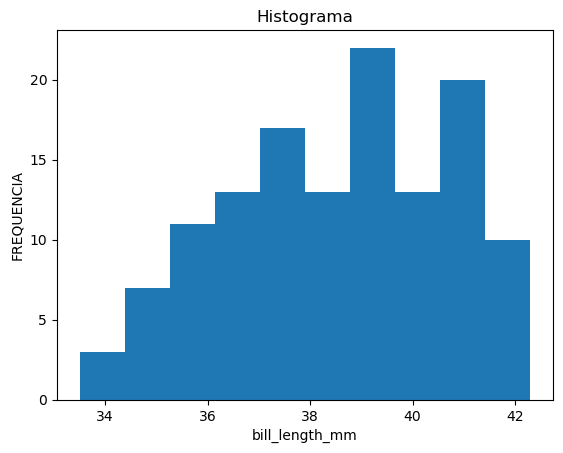

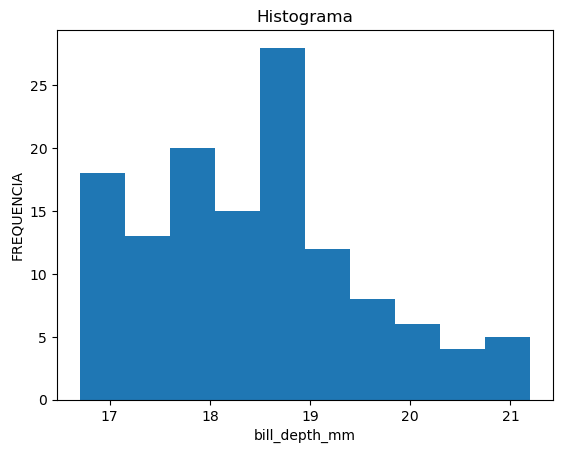

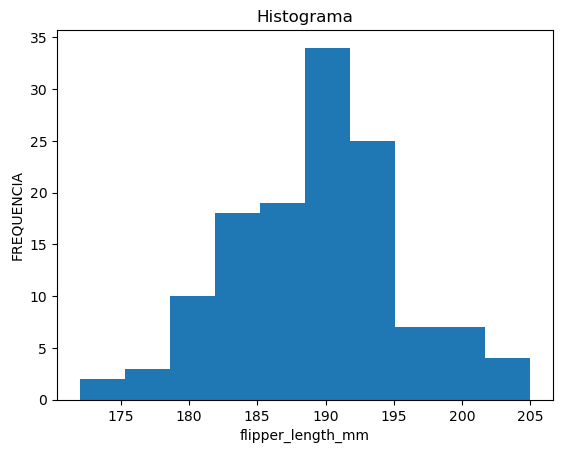

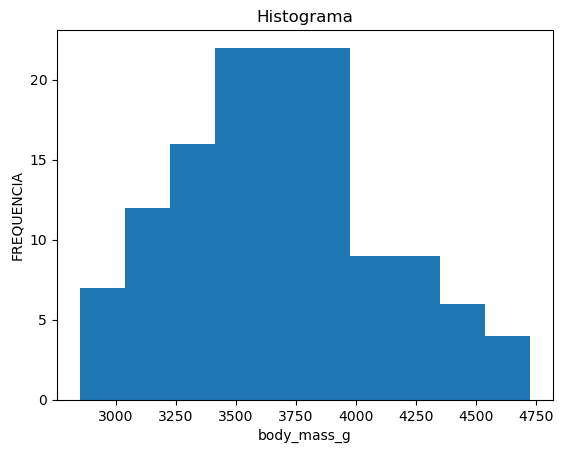

In [72]:
for a in range(4):
    plt.hist(x[x.columns[a+2]])
    plt.title(f"Histograma")
    plt.xlabel(f"{x.columns[a+2]}")
    plt.ylabel("FREQUENCIA")
    plt.show()

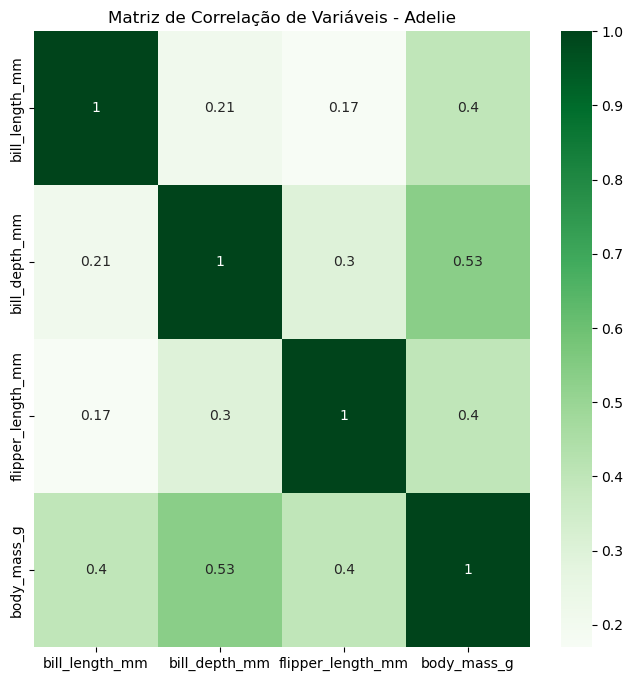

In [76]:
plt.figure(figsize = (8,8))
sns.heatmap(x.drop(['species','island','sex','posição'], axis=1).corr(), annot = True, cmap = 'Greens');
plt.title(f"Matriz de Correlação de Variáveis - {PARAMETROS_ESPECIES[0]}")
plt.show()

### Especie = 1;

In [73]:
y = initial_data.query("flipper_length_mm >= 206.5 and bill_depth_mm <= 17.65")
y

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
220,1,0,46.100000,13.200000,211.000000,4500.00000,1,221
221,1,0,50.000000,16.300000,230.000000,5700.00000,0,222
222,1,0,48.700000,14.100000,210.000000,4450.00000,1,223
223,1,0,50.000000,15.200000,218.000000,5700.00000,0,224
224,1,0,47.600000,14.500000,215.000000,5400.00000,0,225
...,...,...,...,...,...,...,...,...
339,1,0,47.504878,14.982114,217.186992,5076.01626,0,340
340,1,0,46.800000,14.300000,215.000000,4850.00000,1,341
341,1,0,50.400000,15.700000,222.000000,5750.00000,0,342
342,1,0,45.200000,14.800000,212.000000,5200.00000,1,343


In [74]:
y.value_counts('species')

species
1    123
dtype: int64

#### Especie filtrada pela arvore.

In [78]:
fig = px.scatter_3d(y, x='bill_length_mm', y='bill_depth_mm', z='flipper_length_mm',title=f"Penguins - {PARAMETROS_ESPECIES[0]}", color='body_mass_g')
fig.show()

#### Toda a especie 1

In [98]:
y1 = initial_data.query("species == 1")
fig = px.scatter_3d(y1, x='bill_length_mm', y='bill_depth_mm', z='flipper_length_mm',title=f"Penguins - {PARAMETROS_ESPECIES[0]}", color='body_mass_g')
fig.show()

In [79]:
fig = px.scatter(y, x='bill_depth_mm', y='bill_length_mm',title="Penguins", color='body_mass_g')
fig.show()

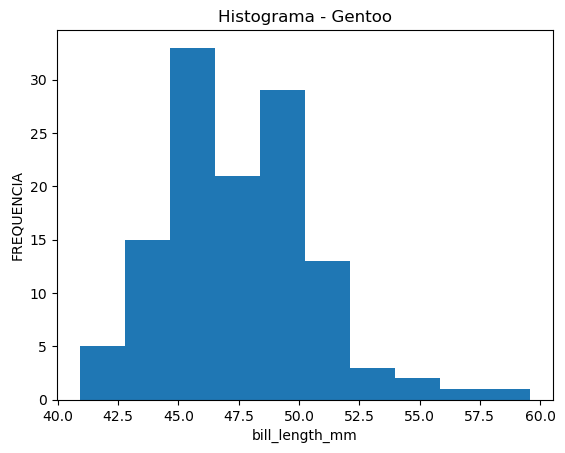

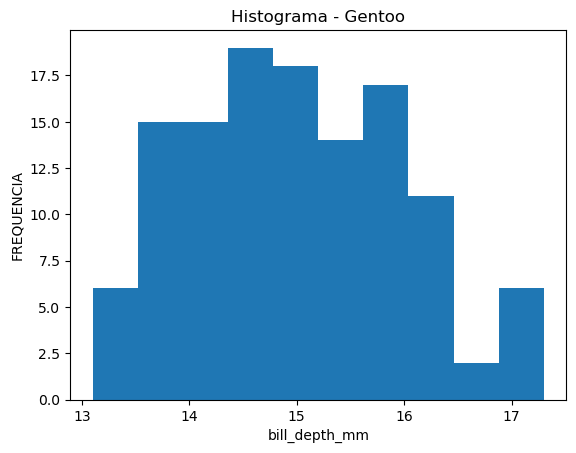

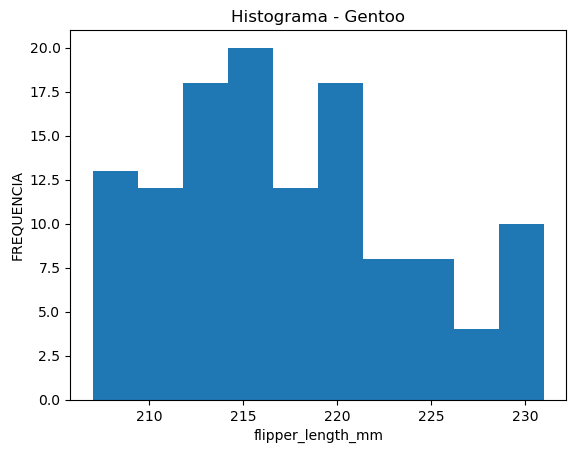

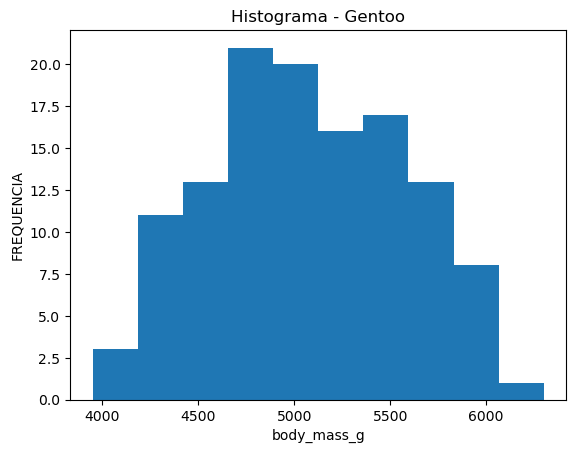

In [81]:
for a in range(4):
    plt.hist(y[y.columns[a+2]])
    plt.title(f"Histograma - {PARAMETROS_ESPECIES[1]}")
    plt.xlabel(f"{y.columns[a+2]}")
    plt.ylabel("FREQUENCIA")
    plt.show()

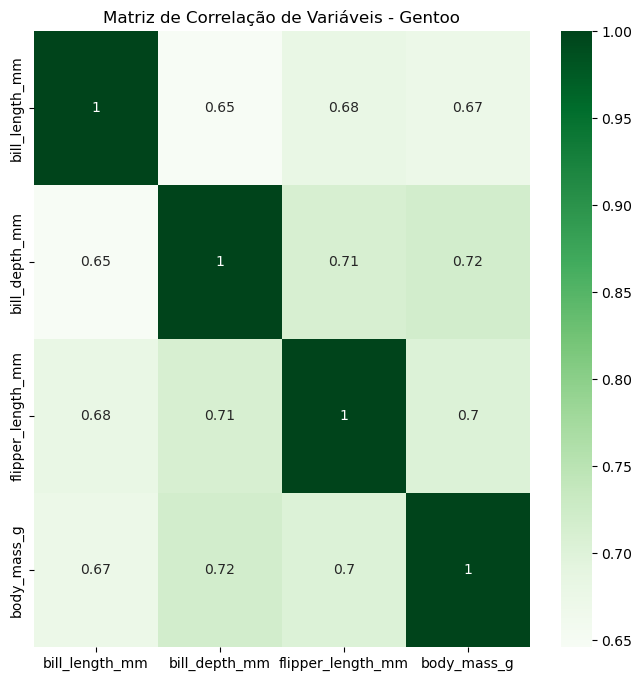

In [82]:
plt.figure(figsize = (8,8))
sns.heatmap(y.drop(['species','island','sex', 'posição'], axis=1).corr(), annot = True, cmap = 'Greens');
plt.title(f"Matriz de Correlação de Variáveis - {PARAMETROS_ESPECIES[1]}")
plt.show()

### Especie = 2;

In [84]:
# 190 - peso muito baixo.
z = initial_data.query("flipper_length_mm <= 206.5 and bill_length_mm >= 43.35 and body_mass_g <= 4125.0")
z

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,posição
152,2,1,46.5,17.9,192.0,3500.0,1,153
153,2,1,50.0,19.5,196.0,3900.0,0,154
154,2,1,51.3,19.2,193.0,3650.0,0,155
155,2,1,45.4,18.7,188.0,3525.0,1,156
156,2,1,52.7,19.8,197.0,3725.0,0,157
157,2,1,45.2,17.8,198.0,3950.0,1,158
158,2,1,46.1,18.2,178.0,3250.0,1,159
159,2,1,51.3,18.2,197.0,3750.0,0,160
161,2,1,51.3,19.9,198.0,3700.0,0,162
162,2,1,46.6,17.8,193.0,3800.0,1,163


In [85]:
z.value_counts('species')

species
2    51
dtype: int64

#### Filtrada com query da arvore.

In [90]:
fig = px.scatter_3d(z, x='bill_length_mm', y='bill_depth_mm', z='flipper_length_mm',title=f"Penguins - {PARAMETROS_ESPECIES[0]}", color='body_mass_g')
fig.show()

#### Toda a especie

In [93]:
z1 = initial_data.query("species == 2")
fig = px.scatter_3d(z1, x='bill_length_mm', y='bill_depth_mm', z='flipper_length_mm',title=f"Penguins - {PARAMETROS_ESPECIES[0]}", color='body_mass_g')
fig.show()

In [88]:
fig = px.scatter(x, x='bill_depth_mm', y='bill_length_mm',title="Penguins", color='body_mass_g')
fig.show()

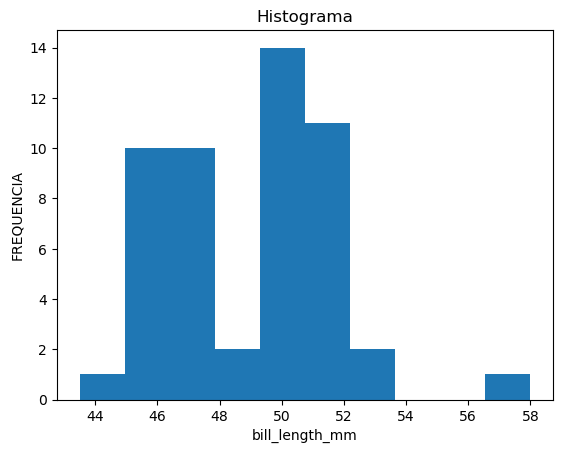

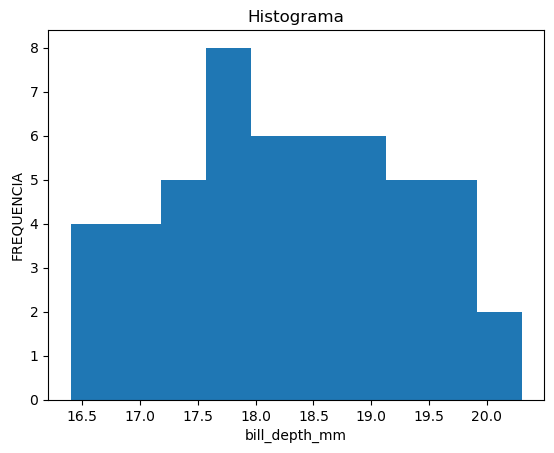

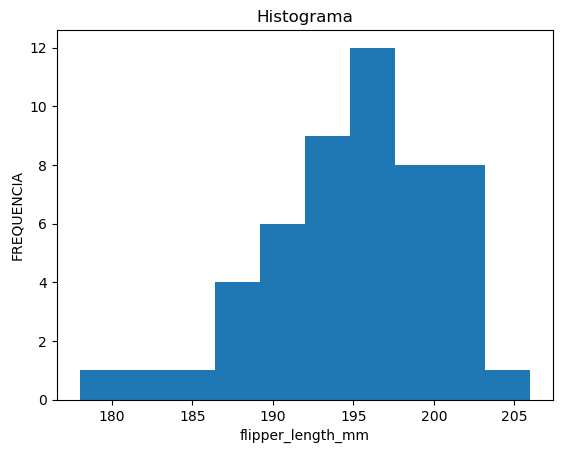

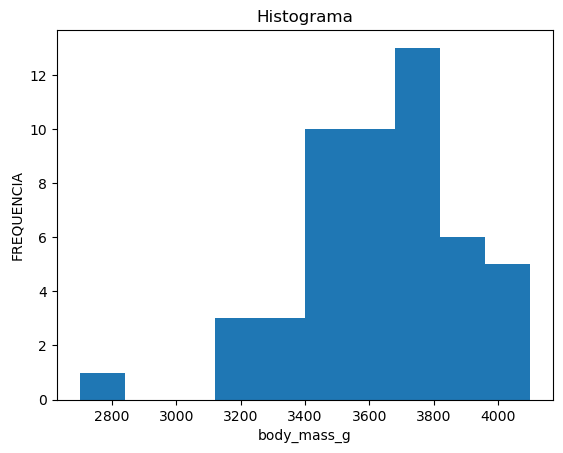

In [91]:
for a in range(4):
    plt.hist(z[z.columns[a+2]])
    plt.title(f"Histograma")
    plt.xlabel(f"{z.columns[a+2]}")
    plt.ylabel("FREQUENCIA")
    plt.show()

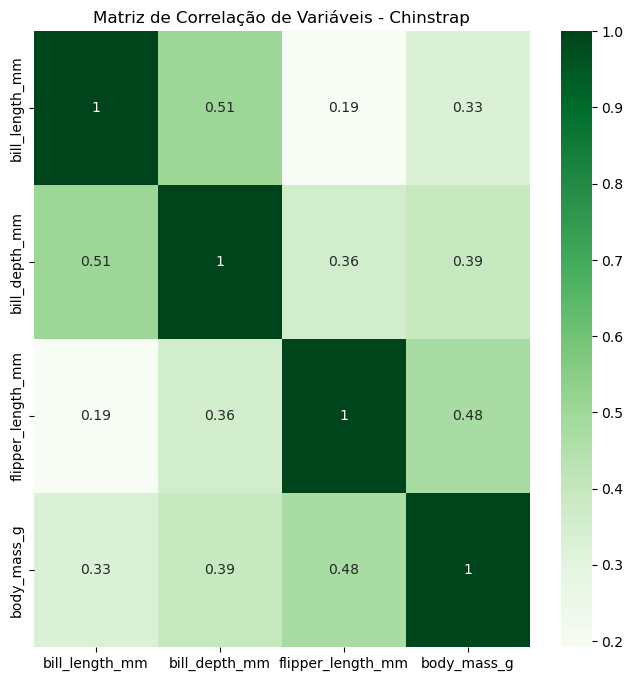

In [87]:
plt.figure(figsize = (8,8))
sns.heatmap(z.drop(['species','island','sex','posição'], axis=1).corr(), annot = True, cmap = 'Greens');
plt.title(f"Matriz de Correlação de Variáveis - {PARAMETROS_ESPECIES[2]}")
plt.show()